In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gp
import geopandas as gpd
from sklearn.cluster import KMeans
import numpy as np

In [3]:
data1 = pd.read_csv('1.csv', dtype={'tenant': str})
data2 = pd.read_csv('2.csv', dtype={'tenant': str})
data3 = pd.read_csv('3.csv', dtype={'tenant': str})
data4 = pd.read_csv('4.csv', dtype={'tenant': str})
data5 = pd.read_csv('5.csv', dtype={'tenant': str})
# if not set dtype={'tenant': str}. then I'll get: 
# DtypeWarning: Columns (10) have mixed types. Specify dtype option on import or set low_memory=False.

In [4]:
merged = pd.concat([data1,data2,data3,data4,data5])
merged = merged[['datetime', 'site_latitude', 'site_longitude', 'site_name', 'pm2_5_calibrated_value']]

merged.shape

(940254, 5)

# EDA

In [5]:
merged['datetime'] = pd.to_datetime(merged['datetime'])  # 将日期时间字符串转换为Pandas的datetime对象
merged = merged.sort_values(by='datetime')

# 从datetime对象中提取出具体的时间特征
merged['hour'] = merged['datetime'].dt.hour
merged['day'] = merged['datetime'].dt.day
merged['month'] = merged['datetime'].dt.month
merged['year'] = merged['datetime'].dt.year

In [6]:
# Check Data Type again -- Correct
for column in merged.columns:
    data_type = merged[column].dtype
    print(f"{column}: {data_type}")

datetime: datetime64[ns]
site_latitude: float64
site_longitude: float64
site_name: object
pm2_5_calibrated_value: float64
hour: int32
day: int32
month: int32
year: int32


In [7]:
from glob import glob

# Load and prepare initial data
# Ensure merged is already loaded with correct data types and column names
# Example: merged = pd.read_csv('initial_data.csv')

# Read all result files and merge
files = glob("site_*_results.csv")
results_list = [pd.read_csv(file) for file in files]
all_results = pd.concat(results_list, ignore_index=True)

# Convert data types
all_results[['YEAR', 'MO', 'DY', 'HR']] = all_results[['YEAR', 'MO', 'DY', 'HR']].astype(int)
merged[['year', 'month', 'day', 'hour']] = merged[['year', 'month', 'day', 'hour']].astype(int)

# Rename columns to match
all_results.rename(columns={
    'YEAR': 'year', 
    'MO': 'month', 
    'DY': 'day', 
    'HR': 'hour',
    'LON': 'site_longitude', 
    'LAT': 'site_latitude'
}, inplace=True)

# Convert longitude and latitude to numeric
all_results['site_longitude'] = pd.to_numeric(all_results['site_longitude'], errors='coerce')
all_results['site_latitude'] = pd.to_numeric(all_results['site_latitude'], errors='coerce')

# Merge datasets
merged = pd.merge(merged, all_results, how='left', on=['site_longitude', 'site_latitude', 'year', 'month', 'day', 'hour'])

# Select desired columns
desired_columns = ['datetime', 'site_latitude', 'site_longitude', 'site_name', 'year', 'month', 'day', 'hour', 'RH2M', 'T2M', 'PRECTOTCORR', 'pm2_5_calibrated_value']
merged = merged[desired_columns]
merged = merged.drop(columns=['year', 'month', 'day', 'hour'])
# Print to verify
print(merged.head())


             datetime  site_latitude  site_longitude  \
0 2022-01-01 01:00:00       0.290822       32.553698   
1 2022-01-01 01:00:00       0.313128       32.582862   
2 2022-01-01 01:00:00       0.284617       32.588796   
3 2022-01-01 01:00:00       0.313128       32.582862   
4 2022-01-01 01:00:00       0.325158       32.552697   

                   site_name   RH2M    T2M  PRECTOTCORR  \
0            Rubaga, Kampala  87.81  18.75         0.04   
1             KampalaCentral  87.81  18.75         0.04   
2  Makindye, Lukuli Makindye  87.81  18.75         0.04   
3             KampalaCentral  87.81  18.75         0.04   
4                     Rubaga  87.81  18.75         0.04   

   pm2_5_calibrated_value  
0                   11.87  
1                   32.44  
2                   14.91  
3                   32.44  
4                   30.59  


In [8]:
# Change Data Type
merged['datetime'] = pd.to_datetime(merged['datetime'], dayfirst=False, utc=True)  # Ensure the datetime is in UTC
merged['site_name'] = merged['site_name'].astype('string')
print(merged['datetime'].head())
# Convert 'datetime' from UTC to EAT (East Africa Time, UTC+3)
merged['datetime'] = merged['datetime'].dt.tz_convert('Africa/Nairobi')  # Convert to EAT
print(merged['datetime'].head())

0   2022-01-01 01:00:00+00:00
1   2022-01-01 01:00:00+00:00
2   2022-01-01 01:00:00+00:00
3   2022-01-01 01:00:00+00:00
4   2022-01-01 01:00:00+00:00
Name: datetime, dtype: datetime64[ns, UTC]
0   2022-01-01 04:00:00+03:00
1   2022-01-01 04:00:00+03:00
2   2022-01-01 04:00:00+03:00
3   2022-01-01 04:00:00+03:00
4   2022-01-01 04:00:00+03:00
Name: datetime, dtype: datetime64[ns, Africa/Nairobi]


In [9]:
# Check Data Type again -- Correct
for column in merged.columns:
    data_type = merged[column].dtype
    print(f"{column}: {data_type}")

datetime: datetime64[ns, Africa/Nairobi]
site_latitude: float64
site_longitude: float64
site_name: string
RH2M: float64
T2M: float64
PRECTOTCORR: float64
pm2_5_calibrated_value: float64


## Check missing values 整个数据集是否存在缺失项：包含nan和0值

In [10]:
print(f"删除缺失项前的数据量: {merged.shape[0]}")

# 统计NaN值的数量
# Count the number of NaN values
nan_count = merged.isna().sum().sum()

# 统计0值的数量
# Count the number of 0 values
zero_count = (merged == 0).sum().sum()

print(f"整个数据框中NaN值的数量: {nan_count}")
print(f"整个数据框中0值的数量: {zero_count}")

# 删除任何包含NaN值的行
# Drop any rows containing NaN values
merged = merged.dropna()

# 删除任何包含0值的行，先将0值替换为NaN，然后使用dropna()
# Drop any rows containing 0 values by first replacing 0 values with NaN, and then using dropna()
merged = merged.replace(0, np.nan).dropna()

# 输出处理后的数据情况
# Output the data state after processing
print(f"删除缺失项后的数据量: {merged.shape[0]}")


删除缺失项前的数据量: 940254
整个数据框中NaN值的数量: 148351
整个数据框中0值的数量: 307013
删除缺失项后的数据量: 535115


## 是否存在site位置和名字不对的情况： 存在
预计后期预测的时候给每个site位置都预测一个，也就是有五个站点会有多个pm2.5预测值

In [11]:
# 分组后检查每个站点名称对应的纬度和经度的唯一值数量
unique_latitudes = merged.groupby('site_name')['site_latitude'].nunique()
unique_longitudes = merged.groupby('site_name')['site_longitude'].nunique()

# 检查是否存在不一致的地点
inconsistent_locations = (unique_latitudes > 1) | (unique_longitudes > 1)

if inconsistent_locations.any():
    print("存在站点名称对应多个地点的情况。")
    # 显示那些站点的名称以及它们对应的唯一纬度和经度数量
    print("站点名称以及它们对应的唯一纬度和经度数量:\n", pd.concat([unique_latitudes, unique_longitudes], axis=1)[inconsistent_locations])
else:
    print("所有站点名称都对应唯一的地点。")


存在站点名称对应多个地点的情况。
站点名称以及它们对应的唯一纬度和经度数量:
                       site_latitude  site_longitude
site_name                                          
KampalaCentral                    5               5
Kawempe                           4               4
Makindye                          4               4
Nakasero II, Kampala              2               2
Rubaga                            3               3


In [12]:
# 找出站点名称对应多个地点的站点名称
inconsistent_site_names = inconsistent_locations[inconsistent_locations].index


# 对于每个站点名称，找到所有不同的地点组合，并只选择每个组合的第一行作为示例
unique_location_samples = merged.drop_duplicates(subset=['site_name', 'site_latitude', 'site_longitude'])

# 筛选出之前识别为对应多个地点的站点名称的记录
samples_inconsistent_locations = unique_location_samples[unique_location_samples['site_name'].isin(inconsistent_site_names)]

# 显示这些示例数据行
print("每个站点名称对应的不同地点的示例数据行:\n", samples_inconsistent_locations)


每个站点名称对应的不同地点的示例数据行:
                       datetime  site_latitude  site_longitude  \
1    2022-01-01 04:00:00+03:00       0.313128       32.582862   
4    2022-01-01 04:00:00+03:00       0.325158       32.552697   
8    2022-01-01 04:00:00+03:00       0.342103       32.591343   
12   2022-01-01 04:00:00+03:00       0.354913       32.559346   
13   2022-01-01 04:00:00+03:00       0.326742       32.571181   
17   2022-01-01 04:00:00+03:00       0.289508       32.580787   
21   2022-01-01 04:00:00+03:00       0.394296       32.585004   
23   2022-01-01 04:00:00+03:00       0.298488       32.593218   
25   2022-01-01 04:00:00+03:00       0.345110       32.547040   
30   2022-01-01 04:00:00+03:00       0.282408       32.548707   
33   2022-01-01 04:00:00+03:00       0.330340       32.578820   
34   2022-01-01 04:00:00+03:00       0.320733       32.599975   
36   2022-01-01 04:00:00+03:00       0.349410       32.562254   
46   2022-01-01 04:00:00+03:00       0.303343       32.565599   
63 

## 是否存在重复项：存在

In [13]:


# 检查是否存在重复项
duplicates = merged.duplicated(subset=['datetime', 'site_latitude', 'site_longitude', 'site_name', 'pm2_5_calibrated_value'], keep=False)
print("存在重复项:", duplicates.any())
if duplicates.any():
    print("重复项数量:", duplicates.sum())
    print("重复项预览:\n", merged[duplicates])


存在重复项: True
重复项数量: 495476
重复项预览:
                         datetime  site_latitude  site_longitude  \
0      2022-01-01 04:00:00+03:00       0.290822       32.553698   
1      2022-01-01 04:00:00+03:00       0.313128       32.582862   
2      2022-01-01 04:00:00+03:00       0.284617       32.588796   
3      2022-01-01 04:00:00+03:00       0.313128       32.582862   
4      2022-01-01 04:00:00+03:00       0.325158       32.552697   
...                          ...            ...             ...   
938147 2022-12-30 09:00:00+03:00       0.335559       32.572891   
938148 2022-12-30 09:00:00+03:00       0.298355       32.587470   
938150 2022-12-30 09:00:00+03:00       0.294889       32.575307   
938152 2022-12-30 09:00:00+03:00       0.284617       32.588796   
938153 2022-12-30 09:00:00+03:00       0.344839       32.638493   

                                        site_name   RH2M    T2M  PRECTOTCORR  \
0                                 Rubaga, Kampala  87.81  18.75         0.04   
1

In [14]:
duplicates

0          True
1          True
2          True
3          True
4          True
          ...  
938149    False
938150     True
938152     True
938153     True
938154    False
Length: 535115, dtype: bool

In [15]:
# 删除重复项，只保留每组重复中的第一条记录
merged_unique = merged.drop_duplicates(subset=['datetime', 'site_latitude', 'site_longitude', 'site_name', 'pm2_5_calibrated_value'])

# 显示处理后的数据情况
print("删除重复项后的数据量:", merged_unique.shape[0])


删除重复项后的数据量: 212647


## 是否存在同一时间地点对应不同pm2.5的情况

In [16]:
# Step 1: 找出所有在'datetime', 'site_latitude', 'site_longitude', 'site_name'下存在重复的行
duplicate_rows = merged_unique[merged_unique.duplicated(subset=['datetime', 'site_latitude', 'site_longitude', 'site_name'], keep=False)]

# Step 2: 对这些重复行进行分组，并找出'pm2_5_calibrated_value'有不同值的组
grouped = duplicate_rows.groupby(['datetime', 'site_latitude', 'site_longitude', 'site_name'])
filtered_groups = grouped.filter(lambda x: x['pm2_5_calibrated_value'].nunique() > 1)

# Step 3: 按'datetime'和'site_name'排序
sorted_filtered_groups = filtered_groups.sort_values(by=['datetime', 'site_name'])

# 展示结果
print("存在同一datetime，site_latitude，site_longitude，site_name对应不同pm2_5_calibrated_value的情况：")
print(sorted_filtered_groups)


存在同一datetime，site_latitude，site_longitude，site_name对应不同pm2_5_calibrated_value的情况：
                        datetime  site_latitude  site_longitude  \
1      2022-01-01 04:00:00+03:00       0.313128       32.582862   
5      2022-01-01 04:00:00+03:00       0.313128       32.582862   
18     2022-01-01 04:00:00+03:00       0.329496       32.570619   
37     2022-01-01 04:00:00+03:00       0.329496       32.570619   
7      2022-01-01 04:00:00+03:00       0.337095       32.610288   
...                          ...            ...             ...   
894104 2022-11-28 01:00:00+03:00       0.337095       32.610288   
900397 2022-12-01 16:00:00+03:00       0.337095       32.610288   
900408 2022-12-01 16:00:00+03:00       0.337095       32.610288   
938109 2022-12-30 09:00:00+03:00       0.302490       32.617487   
938112 2022-12-30 09:00:00+03:00       0.302490       32.617487   

                                  site_name   RH2M    T2M  PRECTOTCORR  \
1                            KampalaCen

## 计算同一时间地点对应不同pm2.5的平均值

In [17]:


# 假设 merged_unique 是你的 DataFrame
# 对 'datetime', 'site_latitude', 'site_longitude', 'site_name' 进行分组
# 并计算 'pm2_5_calibrated_value' 的平均值，同时取 'RH2M', 'T2M', 'PRECTOTCORR' 的首个值
merged_unique = merged_unique.groupby(['datetime', 'site_latitude', 'site_longitude', 'site_name'], as_index=False).agg({
    'pm2_5_calibrated_value': 'mean',
    'RH2M': 'first',
    'T2M': 'first',
    'PRECTOTCORR': 'first'
})




In [18]:
# Data Range
print(f"The data ranges from {merged_unique['datetime'].min()} to {merged_unique['datetime'].max()}")

The data ranges from 2022-01-01 04:00:00+03:00 to 2022-12-30 09:00:00+03:00


In [19]:
# Check Duplicates Again
duplicates = merged_unique.duplicated(subset=['datetime', 'site_latitude', 'site_longitude', 'site_name', 'pm2_5_calibrated_value'], keep=False)
num_duplicates = duplicates.sum()
print(f"Number of duplicate rows based on 'datetime', 'site_latitude', 'site_longitude', 'site_name' and 'pm2_5_calibrated_value': {num_duplicates}")

Number of duplicate rows based on 'datetime', 'site_latitude', 'site_longitude', 'site_name' and 'pm2_5_calibrated_value': 0


In [20]:
# Check Missing Value Again
check_null = merged_unique.isnull().sum()
print(f"Count of NULL in merged_data: \n{check_null}")

Count of NULL in merged_data: 
datetime                  0
site_latitude             0
site_longitude            0
site_name                 0
pm2_5_calibrated_value    0
RH2M                      0
T2M                       0
PRECTOTCORR               0
dtype: int64


In [21]:
zero_pm25_count = (merged_unique['pm2_5_calibrated_value'] == 0).sum()
zero_pm25_count

0

In [22]:


def replace_outliers(group):
    q1 = group['pm2_5_calibrated_value'].quantile(0.25)
    q3 = group['pm2_5_calibrated_value'].quantile(0.75)
    iqr = q3 - q1
    lower_bound = q1 - 1.5 * iqr
    upper_bound = q3 + 1.5 * iqr
    
    # 计算正常值的平均
    mean_value = group[(group['pm2_5_calibrated_value'] >= lower_bound) & 
                       (group['pm2_5_calibrated_value'] <= upper_bound)]['pm2_5_calibrated_value'].mean()
    
    # 替换异常值为平均值
    group['pm2_5_calibrated_value'] = np.where((group['pm2_5_calibrated_value'] < lower_bound) | 
                                               (group['pm2_5_calibrated_value'] > upper_bound),
                                               mean_value, group['pm2_5_calibrated_value'])
    return group

# 按照站点名称分组，并替换每个站点的异常值
merged_unique = merged_unique.groupby('site_name').apply(replace_outliers)

# 重置索引，因为之前的操作可能导致索引不连续
merged_unique = merged_unique.reset_index(drop=True)


C:\Users\DELL\AppData\Local\Temp\ipykernel_25876\1508196788.py:19: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  merged_unique = merged_unique.groupby('site_name').apply(replace_outliers)


In [23]:
# Statistical Summary 
statistical_summary = merged_unique.groupby('site_name')['pm2_5_calibrated_value'].describe()

# Format 'count' as integer
statistical_summary['count'] = statistical_summary['count'].astype(int)

# Format other columns to two decimal places
float_columns = statistical_summary.select_dtypes(include=['float']).columns
for column in float_columns:
    statistical_summary[column] = statistical_summary[column].round(2)

statistical_summary



,count,mean,std,min,25%,50%,75%,max
site_name,,,,,,,,
"Bahai, Kawempe",1735,25.86,11.21,7.19,17.37,23.33,30.84,59.09
"Banda, Kampala",2821,23.21,8.98,7.38,16.71,21.72,26.53,52.05
"Bugolobi, Nakawa",3492,19.58,10.31,5.22,12.32,15.96,24.44,52.71
"Bukasa, Kira Municipality",4324,20.16,7.89,6.44,14.90,18.22,22.78,46.76
"Bukoto I, Kawempe",3880,31.82,17.29,6.93,18.33,27.98,39.94,88.00
"Busega, Rubaga",2040,58.03,29.89,7.03,34.54,56.43,73.40,143.00
"Butabika, Nakawa",2876,26.64,14.62,5.13,15.85,22.47,33.36,73.31
City parents primary school,943,33.83,16.53,8.74,20.82,30.24,42.99,83.91
"Civic Centre, Kampala Central",671,54.16,22.30,7.93,36.09,54.16,65.82,116.52


# Visualization: Time Series Analysis

C:\Users\DELL\AppData\Local\Temp\ipykernel_25876\1569082498.py:20: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  monthly_pm25 = plotting_data['pm2_5_calibrated_value'].resample('M').mean()
C:\Users\DELL\AppData\Local\Temp\ipykernel_25876\1569082498.py:23: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  quarterly_pm25 = plotting_data['pm2_5_calibrated_value'].resample('Q').mean()


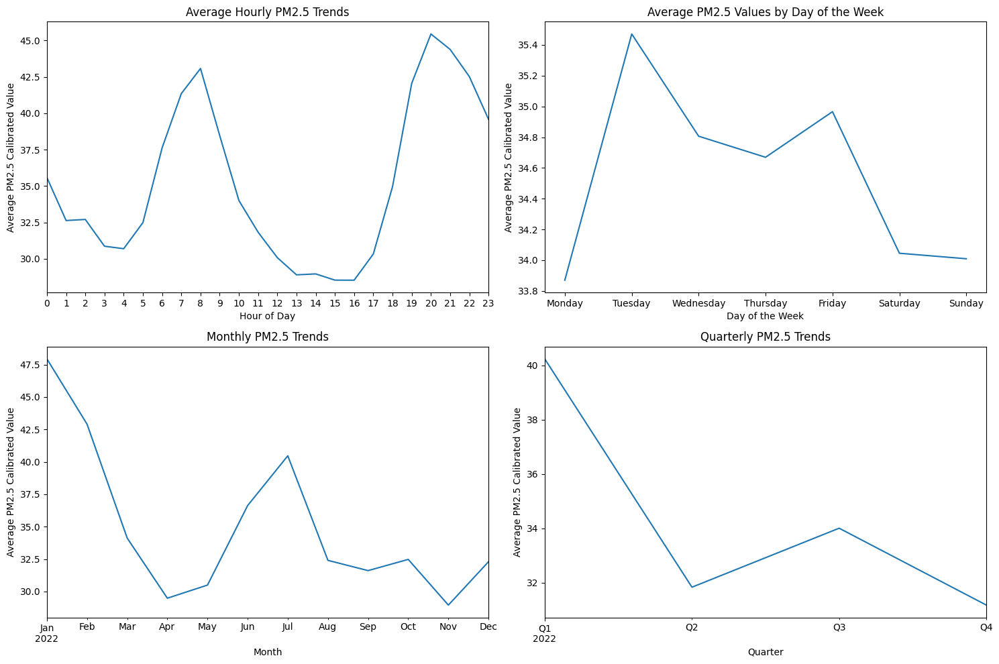

In [24]:
import matplotlib.pyplot as plt
import pandas as pd

# Assuming merged_unique is already defined and contains the required data
plotting_data = merged_unique.copy()

plotting_data['datetime'] = pd.to_datetime(plotting_data['datetime'])
plotting_data.set_index('datetime', inplace=True)

# Hourly
plotting_data['hour'] = plotting_data.index.hour
hourly_avg_pm25 = plotting_data.groupby('hour')['pm2_5_calibrated_value'].mean()

# Weekly
plotting_data['weekday'] = plotting_data.index.weekday #weekday:0-Mon, 6-Sun
weekly_avg_pm25 = plotting_data.groupby('weekday')['pm2_5_calibrated_value'].mean()
weekly_avg_pm25.index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

# Monthly
monthly_pm25 = plotting_data['pm2_5_calibrated_value'].resample('M').mean()

# Quarterly
quarterly_pm25 = plotting_data['pm2_5_calibrated_value'].resample('Q').mean()

# Creating subplots
fig, axs = plt.subplots(2, 2, figsize=(15, 10))

# Plotting Hourly
hourly_avg_pm25.plot(ax=axs[0, 0], title='Average Hourly PM2.5 Trends')
axs[0, 0].set_ylabel('Average PM2.5 Calibrated Value')
axs[0, 0].set_xlabel('Hour of Day')
axs[0, 0].set_xticks(range(0, 24))
axs[0, 0].set_xlim(0, 23)

# Plotting Weekly
weekly_avg_pm25.plot(kind='line', ax=axs[0, 1], title='Average PM2.5 Values by Day of the Week')
axs[0, 1].set_ylabel('Average PM2.5 Calibrated Value')
axs[0, 1].set_xlabel('Day of the Week')

# Plotting Monthly
monthly_pm25.plot(ax=axs[1, 0], title='Monthly PM2.5 Trends')
axs[1, 0].set_ylabel('Average PM2.5 Calibrated Value')
axs[1, 0].set_xlabel('Month')

# Plotting Quarterly
quarterly_pm25.plot(ax=axs[1, 1], title='Quarterly PM2.5 Trends')
axs[1, 1].set_ylabel('Average PM2.5 Calibrated Value')
axs[1, 1].set_xlabel('Quarter')

# Adjust layout
plt.tight_layout()
plt.show()


## Provide short-term (24 hours) and long-term (1 week) forecasts for both observed locations.

## LSTM

In [25]:
# 导入必要的库
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

# 假设 'merged_unique' 已经被加载，这里假设数据中包含日期时间和pm2.5值等
data = merged_unique

lat_grid_size = 0.001  # 纬度网格大小
long_grid_size = 0.001  # 经度网格大小

# 为每个记录分配网格编号
data['lat_grid'] = np.floor(data['site_latitude'] / lat_grid_size).astype(int)
data['long_grid'] = np.floor(data['site_longitude'] / long_grid_size).astype(int)

# 计算每个网格的 PM2.5 统计特征
grid_stats = data.groupby(['lat_grid', 'long_grid'])['pm2_5_calibrated_value'].agg(['mean', 'median', 'max', 'min']).reset_index()
grid_stats.rename(columns={'mean': 'grid_mean', 'median': 'grid_median', 'max': 'grid_max', 'min': 'grid_min'}, inplace=True)

# 将统计数据合并回原始数据集
data = pd.merge(data, grid_stats, on=['lat_grid', 'long_grid'], how='left')


data['datetime'] = pd.to_datetime(data['datetime'])  # 将日期时间字符串转换为Pandas的datetime对象
data = data.sort_values(by='datetime')

# 从datetime对象中提取出具体的时间特征
data['hour'] = data['datetime'].dt.hour
data['day'] = data['datetime'].dt.day
data['weekday'] = data['datetime'].dt.weekday  # 从0（星期一）到6（星期天）
data['month'] = data['datetime'].dt.month
data['year'] = data['datetime'].dt.year

features_columns = ['hour', 'day', 'weekday', 'month', 'year', 'site_latitude', 'site_longitude', 'lat_grid', 'long_grid', 'grid_mean', 'grid_median', 'RH2M', 'T2M', 'PRECTOTCORR']
target_column = 'pm2_5_calibrated_value'



# 添加经纬度和时间的交互特征
data['lat_hour'] = data['lat_grid'] * data['hour']
data['long_hour'] = data['long_grid'] * data['hour']
# 交互特征
data['temp_rh'] = data['T2M'] * data['RH2M']
data['precip_hour'] = data['PRECTOTCORR'] * data['hour']


# 多项式特征
data['T2M_squared'] = data['T2M'] ** 2
data['RH2M_squared'] = data['RH2M'] ** 2

# 异常天气条件标记
data['high_temp'] = (data['T2M'] > 30).astype(int)  # Assuming 30 degree Celsius as a threshold for high temperature
data['low_temp'] = (data['T2M'] < 0).astype(int)  # Assuming 0 degree Celsius as a threshold for low temperature
data['high_rh'] = (data['RH2M'] > 80).astype(int)  # Assuming 80% as a threshold for high relative humidity
data['low_rh'] = (data['RH2M'] < 20).astype(int)  # Assuming 20% as a threshold for low relative humidity


data.set_index('datetime', inplace=True)
# 创建滚动窗口特征 以天为单位
window_sizes = [1, 3, 5]  # 日窗口大小
for window in window_sizes:
    rolling_means = data['pm2_5_calibrated_value'].rolling(f'{window}D').mean()
    data[f'rolling_mean_{window}day'] = rolling_means

    rolling_maxs = data['pm2_5_calibrated_value'].rolling(f'{window}D').max()
    data[f'rolling_max_{window}day'] = rolling_maxs

    rolling_mins = data['pm2_5_calibrated_value'].rolling(f'{window}D').min()
    data[f'rolling_min_{window}day'] = rolling_mins

# 更新特征列表

features_columns = [
    'hour', 'day', 'weekday', 'month', 'year', 'site_latitude', 'site_longitude',
    'lat_grid', 'long_grid', 'grid_mean', 'grid_median', 'RH2M', 'T2M', 'PRECTOTCORR',
    'temp_rh', 'precip_hour', 'lat_hour', 'long_hour',
    'T2M_squared', 'RH2M_squared', 'high_temp', 'low_temp', 'high_rh', 'low_rh'
]


# 更新特征列表
#features_columns += [f'rolling_mean_{w}day' for w in window_sizes]
#features_columns += [f'rolling_max_{w}day' for w in window_sizes]
#features_columns += [f'rolling_min_{w}day' for w in window_sizes]



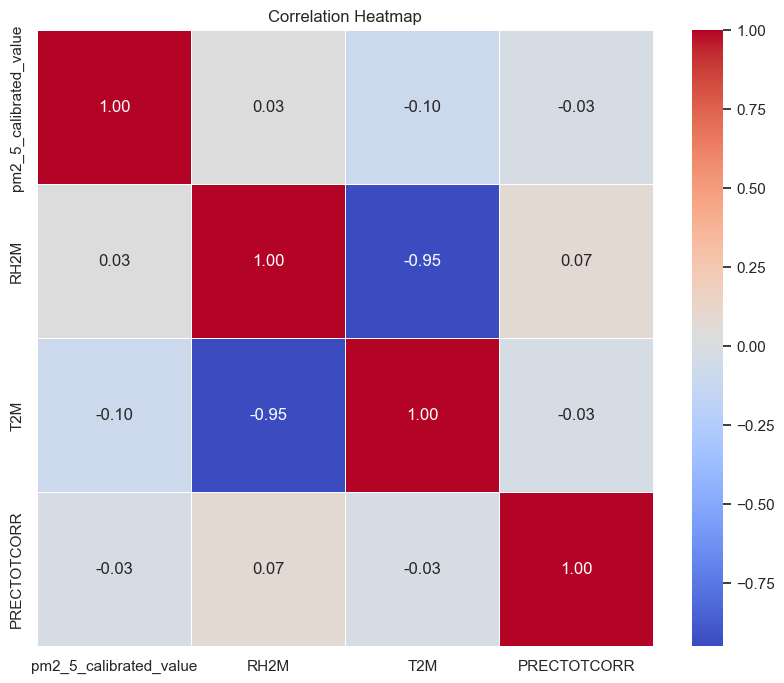

In [26]:
selected_columns = plotting_data[['pm2_5_calibrated_value', 'RH2M', 'T2M', 'PRECTOTCORR']]

# 计算相关性矩阵
corr_matrix = selected_columns.corr()

# 设置绘图风格
sns.set(style='white')

# 创建一个 matplotlib figure
plt.figure(figsize=(10, 8))

# 绘制相关性热力图
heatmap = sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', cbar=True, square=True, linewidths=.5)

# 设置标题
plt.title('Correlation Heatmap')


# 显示图像
plt.show()

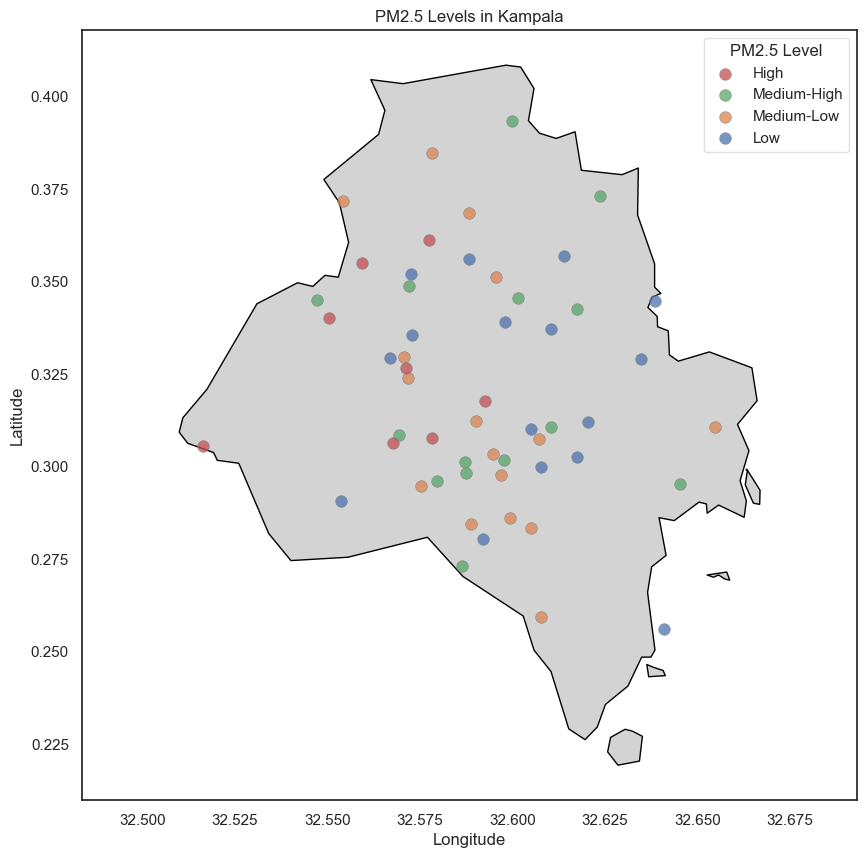

In [27]:
# Split into four groups based on the mean pm2_5_calibrated_value of the site
site_avg_pm25 = plotting_data.groupby('site_name')['pm2_5_calibrated_value'].transform('mean')
plotting_data['pm2_5_calibrated_value_avg'] = site_avg_pm25

# quantile
q1 = plotting_data['pm2_5_calibrated_value_avg'].quantile(0.25)
q2 = plotting_data['pm2_5_calibrated_value_avg'].quantile(0.50)
q3 = plotting_data['pm2_5_calibrated_value_avg'].quantile(0.75)

conditions = [
    (plotting_data['pm2_5_calibrated_value_avg'] <= q1),
    (plotting_data['pm2_5_calibrated_value_avg'] > q1) & (plotting_data['pm2_5_calibrated_value_avg'] <= q2),
    (plotting_data['pm2_5_calibrated_value_avg'] > q2) & (plotting_data['pm2_5_calibrated_value_avg'] <= q3),
    (plotting_data['pm2_5_calibrated_value_avg'] > q3)
]
choices = ['Low', 'Medium-Low', 'Medium-High', 'High']
plotting_data['pm2_5_level'] = np.select(conditions, choices, default='High')

# GeoDataFrame
gdf = gpd.GeoDataFrame(plotting_data, geometry=gpd.points_from_xy(plotting_data.site_longitude,plotting_data.site_latitude))

gdf = gdf.drop_duplicates(subset='site_name', keep='last')

shp = gpd.read_file('gadm41_UGA_1.json')
shp_kampala = shp[shp['NAME_1'] == 'Kampala']

fig, ax = plt.subplots(figsize=(10, 10))
shp_kampala.plot(ax=ax, color='lightgray', edgecolor='black')

for level in choices:
    level_gdf = gdf[gdf['pm2_5_level'] == level]
    ax.scatter(level_gdf.geometry.x, level_gdf.geometry.y, s=70, label=level,
    alpha=0.75, edgecolors='gray', linewidth=0.5)

ax.grid(False)

ax.set_title('PM2.5 Levels in Kampala')
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.axis('equal')


handles, labels = ax.get_legend_handles_labels()
order = ['High', 'Medium-High', 'Medium-Low', 'Low']
ordered_handles = [handles[labels.index(l)] for l in order]
ax.legend(ordered_handles, order, title='PM2.5 Level', loc='upper right', frameon=True, framealpha=0.6)

plt.show()

<Figure size 1000x600 with 0 Axes>

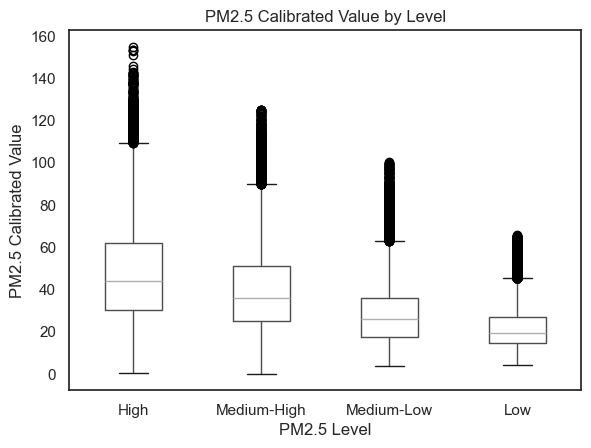

In [28]:
# boxplot for each level

# order
plotting_data['pm2_5_level'] = pd.Categorical(plotting_data['pm2_5_level'],
                                              categories=['High', 'Medium-High', 'Medium-Low', 'Low'],
                                              ordered=True)

plt.figure(figsize=(10, 6))
plotting_data.boxplot(column='pm2_5_calibrated_value', by='pm2_5_level', grid=False)

plt.title('PM2.5 Calibrated Value by Level')
plt.suptitle('')
plt.xlabel('PM2.5 Level')
plt.ylabel('PM2.5 Calibrated Value')

plt.show()



C:\Users\DELL\AppData\Local\Temp\ipykernel_25876\2178411997.py:17: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  resampled_data = level_data['pm2_5_calibrated_value'].resample(freq).mean()
C:\Users\DELL\AppData\Local\Temp\ipykernel_25876\2178411997.py:17: FutureWarning: 'Q' is deprecated and will be removed in a future version, please use 'QE' instead.
  resampled_data = level_data['pm2_5_calibrated_value'].resample(freq).mean()


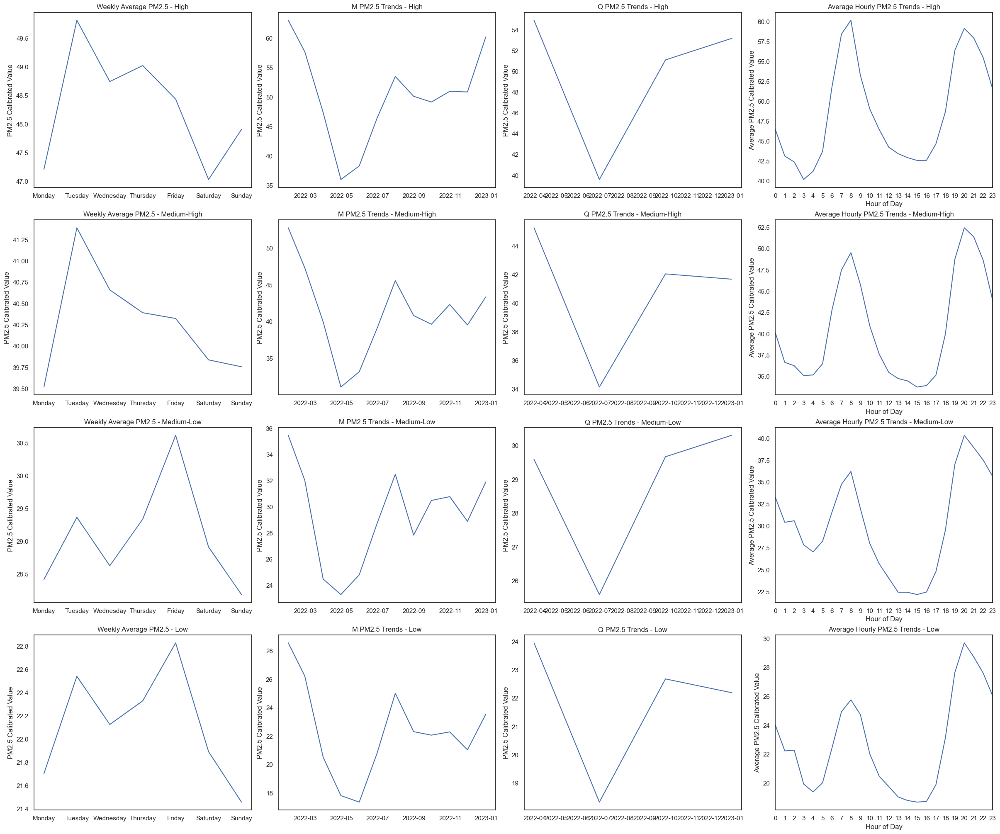

In [29]:
#Following the previous analysis of the time series of the overall data, 
# the visualisation was done for each of the four groups
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(24, 20), constrained_layout=True)
pm2_5_levels = ['High', 'Medium-High', 'Medium-Low', 'Low']

for i, level in enumerate(pm2_5_levels):
    level_data = plotting_data[plotting_data['pm2_5_level'] == level].copy()
    
    for j, freq in enumerate(['W', 'M', 'Q']):
        if freq == 'W':
            level_data['weekday'] = level_data.index.weekday
            weekly_avg_pm25 = level_data.groupby('weekday')['pm2_5_calibrated_value'].mean()
            weekly_avg_pm25.index = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
            axes[i, j].plot(weekly_avg_pm25.index, weekly_avg_pm25.values)
            axes[i, j].set_title(f'Weekly Average PM2.5 - {level}')
        else:
            resampled_data = level_data['pm2_5_calibrated_value'].resample(freq).mean()
            axes[i, j].plot(resampled_data.index, resampled_data.values)
            axes[i, j].set_title(f'{freq} PM2.5 Trends - {level}')
        
        axes[i, j].set_ylabel('PM2.5 Calibrated Value')
        
    level_data['hour'] = level_data.index.hour
    hourly_avg_pm25 = level_data.groupby('hour')['pm2_5_calibrated_value'].mean()
    axes[i, 3].plot(hourly_avg_pm25.index, hourly_avg_pm25.values)
    axes[i, 3].set_title(f'Average Hourly PM2.5 Trends - {level}')
    axes[i, 3].set_ylabel('Average PM2.5 Calibrated Value')
    axes[i, 3].set_xlabel('Hour of Day')
    axes[i, 3].set_xticks(range(0, 24))
    axes[i, 3].set_xlim(0, 23)

plt.show()


In [30]:
data_test = data

In [31]:
import torch.nn as nn

class LSTMModel(nn.Module):
    def __init__(self, input_size, hidden_size, num_layers, output_size, dropout_rate):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(input_size, hidden_size, num_layers, batch_first=True)
        self.dropout = nn.Dropout(dropout_rate)
        self.linear = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        out, (hn, cn) = self.lstm(x)
        out = self.dropout(out[:, -1, :])  # 在最后一个时间步的输出上应用 dropout
        out = self.linear(out)
        return out


In [78]:
import numpy as np
import torch
import torch.optim as optim
import torch.nn as nn
from sklearn.metrics import mean_squared_error, mean_absolute_error
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# 假设 data 是我们的 DataFrame，已经筛选为一月到十月的数据
data = data[(data.index.month >= 1) & (data.index.month <= 11)]

def create_sequences_by_site(data, sequence_length):
    grouped = data.groupby(['site_latitude', 'site_longitude'])
    xs = []
    ys = []
    location_info = []  # 存储地点信息
    hours = []          # 存储累计小时信息

    for (lat, lon), group in grouped:
        features = group[features_columns].values
        target = group[target_column].values
        # 确保 hour 列已经按你的需求计算好了
        hour_values = group['hour'].values  
        for i in range(len(group) - sequence_length):
            x = features[i:(i + sequence_length)]
            y = target[i + sequence_length]
            xs.append(x)
            ys.append(y)
            location_info.append((lat, lon))
            hours.append(hour_values[i + sequence_length])  # 收集对应目标值的累计小时

    return np.array(xs), np.array(ys), location_info, hours


# 创建序列
sequence_length = 2
X, y, locations, hours = create_sequences_by_site(data, sequence_length)



In [79]:
# 参数设置
n_splits = 4
input_size = X.shape[2]
hidden_size = 50
num_layers = 2
output_size = 1
epochs = 15
batch_size = 64
dropout_rate = 0.5

# 交叉验证
tss = TimeSeriesSplit(n_splits=n_splits)
metrics_results = []  # 存储每个 fold 的指标结果

# 检查是否有 GPU 可用，并相应地设置 device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
for fold, (train_idx, test_idx) in enumerate(tss.split(X)):
    X_train, X_test = X[train_idx], X[test_idx]
    y_train, y_test = y[train_idx], y[test_idx]

    # 标准化
    scaler = StandardScaler()
    X_train_reshaped = X_train.reshape(-1, X_train.shape[-1])  # 调整形状以适应scaler
    X_train_scaled = scaler.fit_transform(X_train_reshaped).reshape(X_train.shape)

    X_test_reshaped = X_test.reshape(-1, X_test.shape[-1])
    X_test_scaled = scaler.transform(X_test_reshaped).reshape(X_test.shape)

    # 转换为张量并加载到 DataLoader
    train_data = TensorDataset(torch.tensor(X_train_scaled, dtype=torch.float32), torch.tensor(y_train, dtype=torch.float32))
    test_data = TensorDataset(torch.tensor(X_test_scaled, dtype=torch.float32), torch.tensor(y_test, dtype=torch.float32))

    train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
    test_loader = DataLoader(test_data, batch_size=64, shuffle=False)


    # 模型、损失函数和优化器
    model = LSTMModel(input_size, hidden_size, num_layers, output_size, dropout_rate).to(device)
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.01)

    fold_metrics = {
        'train_rmse': [], 'test_rmse': [],
        'train_mae': [], 'test_mae': [],
        'train_mape': [], 'test_mape': []
    }

    for epoch in range(epochs):
        # 训练模型
        model.train()
        train_losses, train_mae, train_mape = [], [], []
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            outputs = outputs.squeeze()
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            train_losses.append(loss.item())
            train_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.detach().cpu().numpy()))
            train_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.detach().cpu().numpy()) / targets.cpu().numpy())) * 100)

        fold_metrics['train_rmse'].append(np.sqrt(np.mean(train_losses)))
        fold_metrics['train_mae'].append(np.mean(train_mae))
        fold_metrics['train_mape'].append(np.mean(train_mape))

        # 测试模型
        model.eval()
        test_losses, test_mae, test_mape = [], [], []
        with torch.no_grad():
            for inputs, targets in test_loader:
                inputs, targets = inputs.to(device), targets.to(device)
                outputs = model(inputs)
                outputs = outputs.squeeze()
                loss = criterion(outputs, targets)
                test_losses.append(loss.item())
                test_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
                test_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        fold_metrics['test_rmse'].append(np.sqrt(np.mean(test_losses)))
        fold_metrics['test_mae'].append(np.mean(test_mae))
        fold_metrics['test_mape'].append(np.mean(test_mape))

        print(f'Fold {fold+1}, Epoch {epoch+1}/{epochs}, Train RMSE: {fold_metrics["train_rmse"][-1]:.4f}, Test RMSE: {fold_metrics["test_rmse"][-1]:.4f}')

    metrics_results.append(fold_metrics)

Fold 1, Epoch 1/15, Train RMSE: 18.1943, Test RMSE: 18.7033
Fold 1, Epoch 2/15, Train RMSE: 15.9209, Test RMSE: 18.2615
Fold 1, Epoch 3/15, Train RMSE: 15.3774, Test RMSE: 18.0643
Fold 1, Epoch 4/15, Train RMSE: 15.0102, Test RMSE: 17.8384
Fold 1, Epoch 5/15, Train RMSE: 14.7459, Test RMSE: 18.1155
Fold 1, Epoch 6/15, Train RMSE: 14.3989, Test RMSE: 18.4304
Fold 1, Epoch 7/15, Train RMSE: 14.1621, Test RMSE: 18.2811
Fold 1, Epoch 8/15, Train RMSE: 13.9180, Test RMSE: 18.3178
Fold 1, Epoch 9/15, Train RMSE: 13.7167, Test RMSE: 18.1818
Fold 1, Epoch 10/15, Train RMSE: 13.4798, Test RMSE: 17.7169
Fold 1, Epoch 11/15, Train RMSE: 13.2570, Test RMSE: 18.1527
Fold 1, Epoch 12/15, Train RMSE: 13.1016, Test RMSE: 18.4498
Fold 1, Epoch 13/15, Train RMSE: 12.9097, Test RMSE: 18.6597
Fold 1, Epoch 14/15, Train RMSE: 12.7476, Test RMSE: 18.1026
Fold 1, Epoch 15/15, Train RMSE: 12.6746, Test RMSE: 18.7984
Fold 2, Epoch 1/15, Train RMSE: 18.5121, Test RMSE: 15.9770
Fold 2, Epoch 2/15, Train RMSE: 16

In [80]:
import numpy as np

# 修正代码以适应当前的数据结构
average_train_rmse_per_fold = [np.mean(fold_metrics['train_rmse']) for fold_metrics in metrics_results]
average_test_rmse_per_fold = [np.mean(fold_metrics['test_rmse']) for fold_metrics in metrics_results]

average_train_mae_per_fold = [np.mean(fold_metrics['train_mae']) for fold_metrics in metrics_results]
average_test_mae_per_fold = [np.mean(fold_metrics['test_mae']) for fold_metrics in metrics_results]

average_train_mape_per_fold = [np.mean(fold_metrics['train_mape']) for fold_metrics in metrics_results]
average_test_mape_per_fold = [np.mean(fold_metrics['test_mape']) for fold_metrics in metrics_results]

average_train_rmse_overall = np.mean(average_train_rmse_per_fold)
average_test_rmse_overall = np.mean(average_test_rmse_per_fold)

average_train_mae_overall = np.mean(average_train_mae_per_fold)
average_test_mae_overall = np.mean(average_test_mae_per_fold)

average_train_mape_overall = np.mean(average_train_mape_per_fold)
average_test_mape_overall = np.mean(average_test_mape_per_fold)

# 打印每个 fold 的结果以及整体平均
print("Train RMSE per fold:", average_train_rmse_per_fold)
print("Test RMSE per fold:", average_test_rmse_per_fold)
print("Train MAE per fold:", average_train_mae_per_fold)
print("Test MAE per fold:", average_test_mae_per_fold)
print("Train MAPE per fold:", average_train_mape_per_fold)
print("Test MAPE per fold:", average_test_mape_per_fold)
print("Overall average train RMSE:", average_train_rmse_overall)
print("Overall average test RMSE:", average_test_rmse_overall)
print("Overall average train MAE:", average_train_mae_overall)
print("Overall average test MAE:", average_test_mae_overall)
print("Overall average train MAPE:", average_train_mape_overall)
print("Overall average test MAPE:", average_test_mape_overall)


Train RMSE per fold: [14.240979386839578, 14.734129863940588, 14.070893503165394, 13.920104966500833]
Test RMSE per fold: [18.271612496566195, 14.94922112924951, 14.720555860737976, 15.559269677922426]
Train MAE per fold: [10.349311, 10.630315, 10.213199, 10.049896]
Test MAE per fold: [13.100844, 11.064473, 10.582903, 11.037625]
Train MAPE per fold: [50.79606606717083, 43.52458769155022, 40.98486936981248, 39.09050723182631]
Test MAPE per fold: [41.287909056948514, 42.20105345906883, 39.2891983708431, 40.43967423904901]
Overall average train RMSE: 14.241526930111597
Overall average test RMSE: 15.875164791119026
Overall average train MAE: 10.31068
Overall average test MAE: 11.446462
Overall average train MAPE: 43.59900759008996
Overall average test MAPE: 40.804458781477365


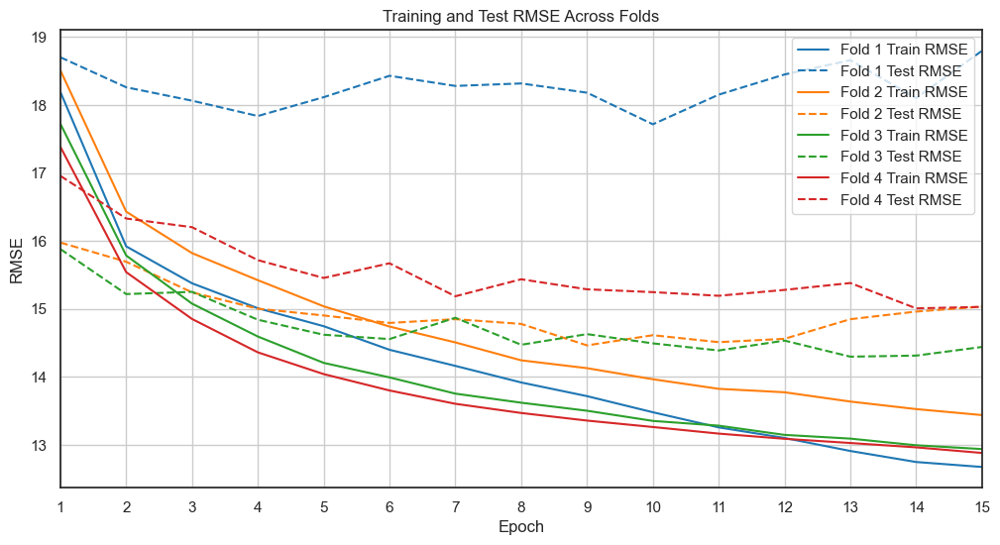

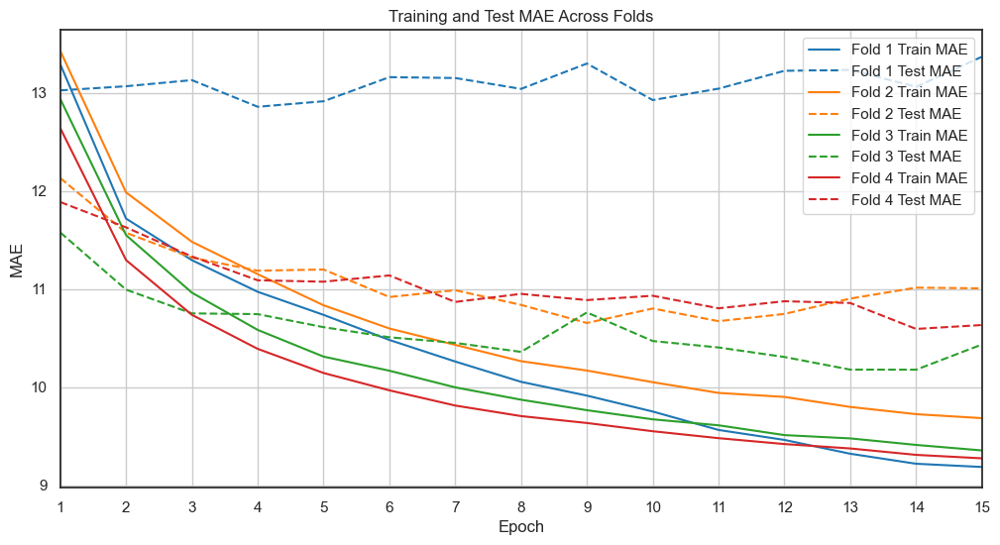

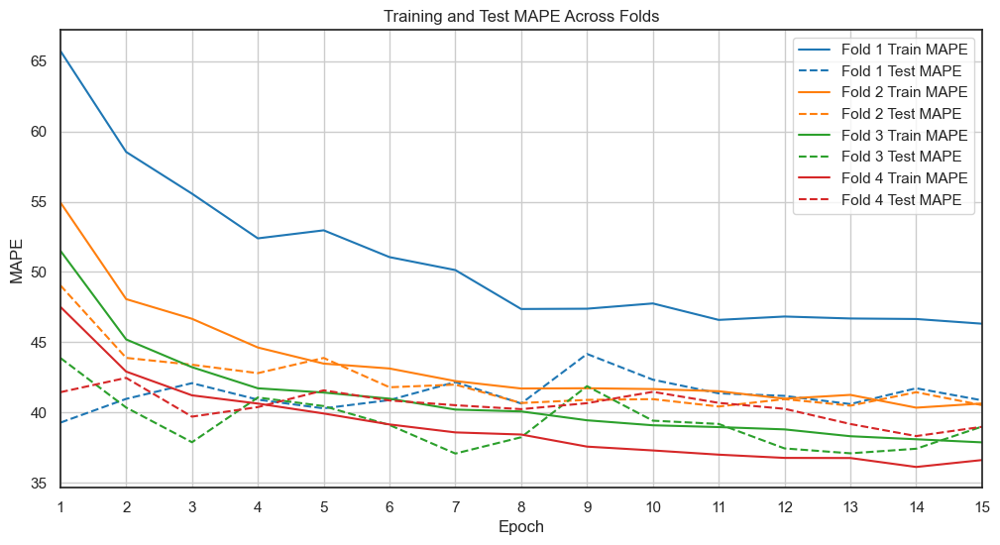

In [81]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
# 绘制图表
def plot_metrics(metrics_results, metric_name, title):
    plt.figure(figsize=(12, 6))
    colors = list(mcolors.TABLEAU_COLORS)  # 使用 Matplotlib 的 tableau 颜色
    epochs_range = range(1, epochs + 1)  # 创建一个从 1 开始的范围
    for i, metrics in enumerate(metrics_results, 1):
        color = colors[(i - 1) % len(colors)]
        plt.plot(epochs_range, metrics[f'train_{metric_name}'], label=f'Fold {i} Train {metric_name.upper()}', color=color, linestyle='-')
        plt.plot(epochs_range, metrics[f'test_{metric_name}'], label=f'Fold {i} Test {metric_name.upper()}', color=color, linestyle='--')
    plt.xlabel('Epoch')
    plt.ylabel(metric_name.upper())
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.xticks(epochs_range)
    plt.xlim(1, epochs)
    plt.show()

plot_metrics(metrics_results, 'rmse', 'Training and Test RMSE Across Folds')
plot_metrics(metrics_results, 'mae', 'Training and Test MAE Across Folds')
plot_metrics(metrics_results, 'mape', 'Training and Test MAPE Across Folds')

## for predict

In [90]:
import pandas as pd
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day==1)]
# 假设 data_test_day 已经包含了所有站点的数据，并且数据已经按时间排序
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])

data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    # 拿到每个站点的第一个数据点（作为DataFrame的一行）
    initial_data = group.iloc[0:1]

    # 创建填充数据，需要使用 `initial_data` 的复制，保持DataFrame结构
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    
    # 重新设置填充数据的时间戳
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    
    # 合并填充数据和原始数据
    padded_group = pd.concat([padding, group])
    
    # 如果你需要保留分组信息，可以在这里添加
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])

# 确保整体DataFrame按时间排序（如果时间戳重要的话）
data_test_day_padded.sort_index(inplace=True)


# 创建序列
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day, sequence_length)

In [104]:
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

# 在模型上运行这个新的测试数据
model.eval()
test_day_losses, test_day_mae, test_day_mape = [], [], []
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = outputs.squeeze()  # 确保输出的维度和目标维度一致
        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))



Test RMSE: 14.330873293056293
Test MAE: 9.637834
Test MAPE: 30.67518605126275


Test RMSE: 14.330873293056293
Test MAE: 9.637834
Test MAPE: 30.67518605126275


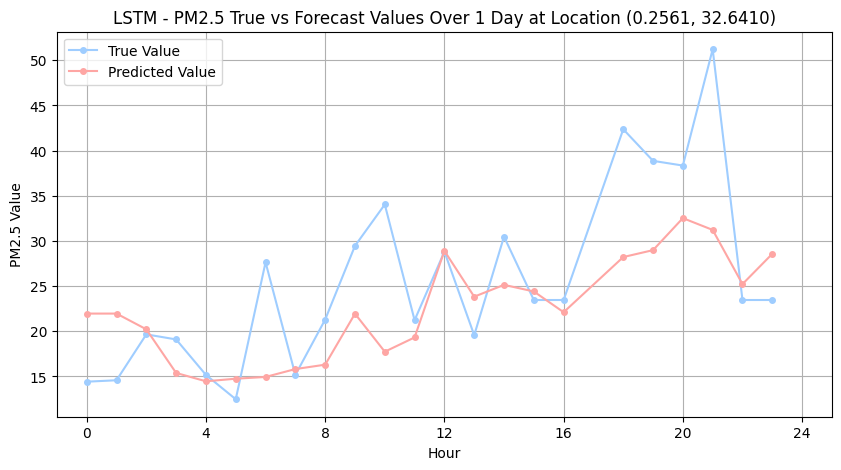

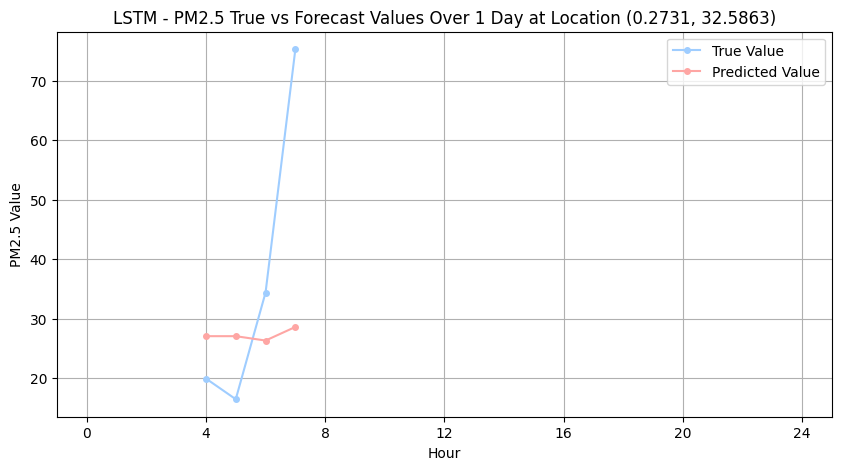

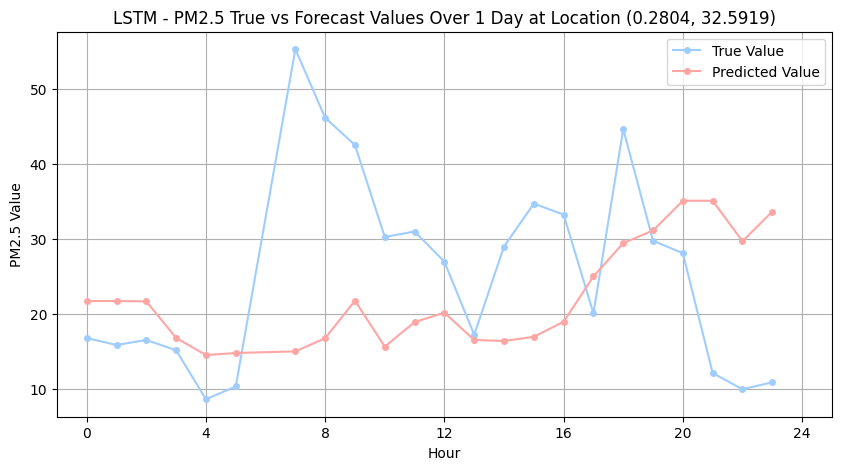

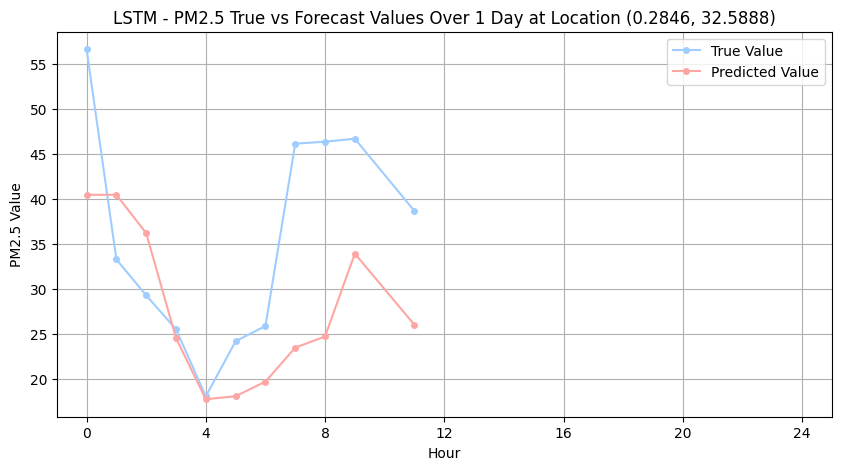

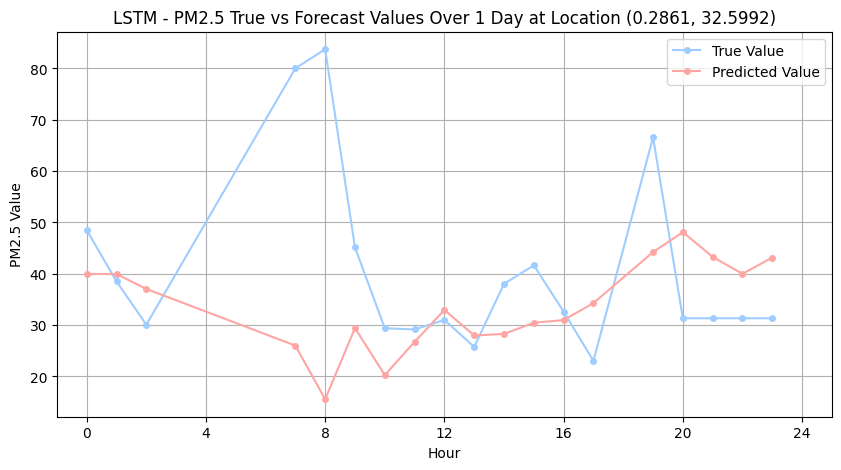

...

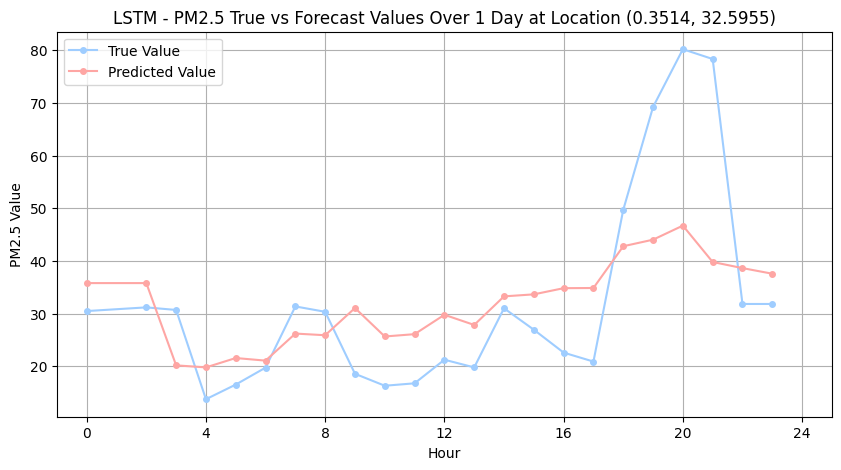

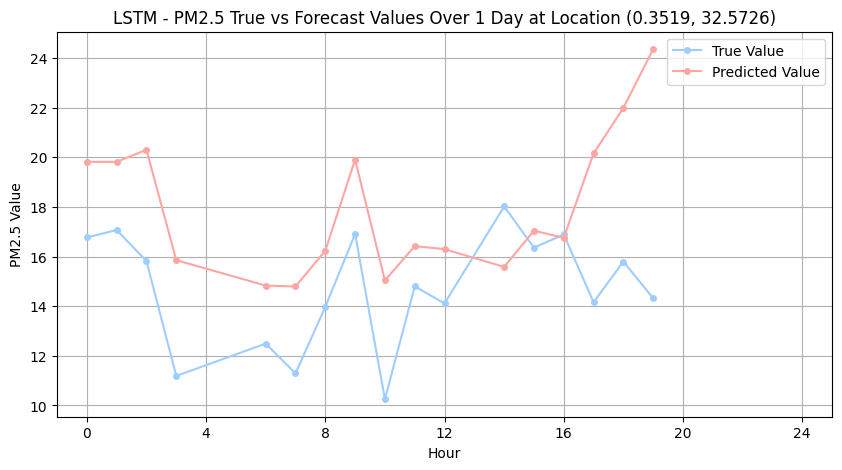

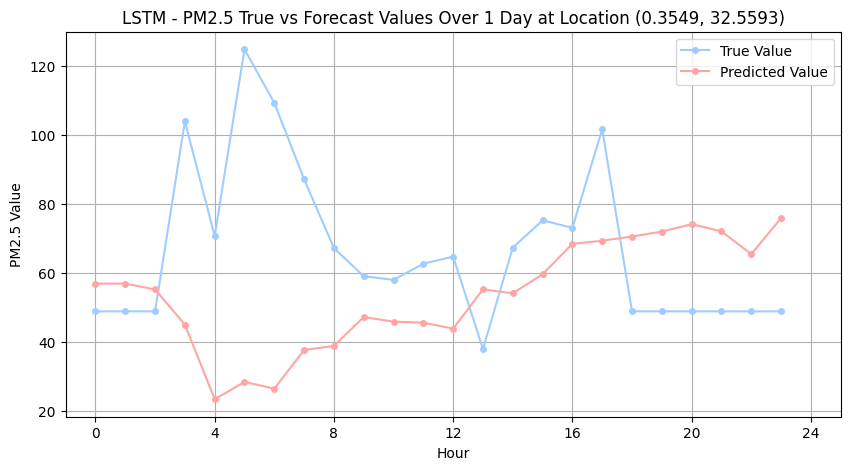

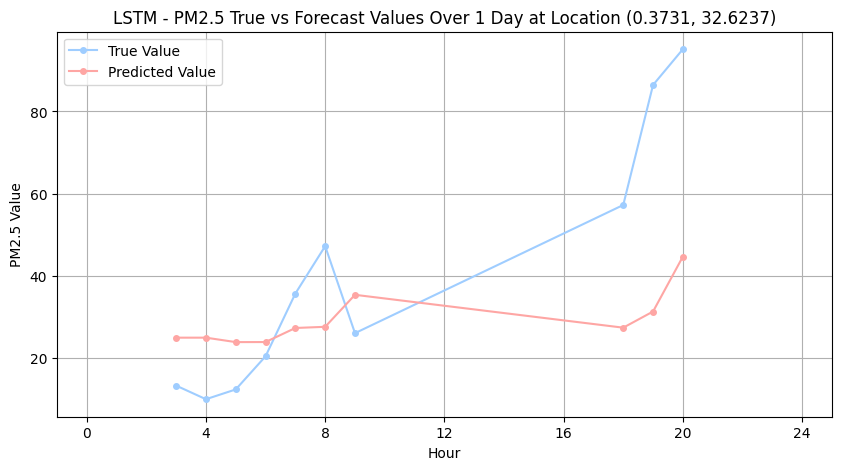

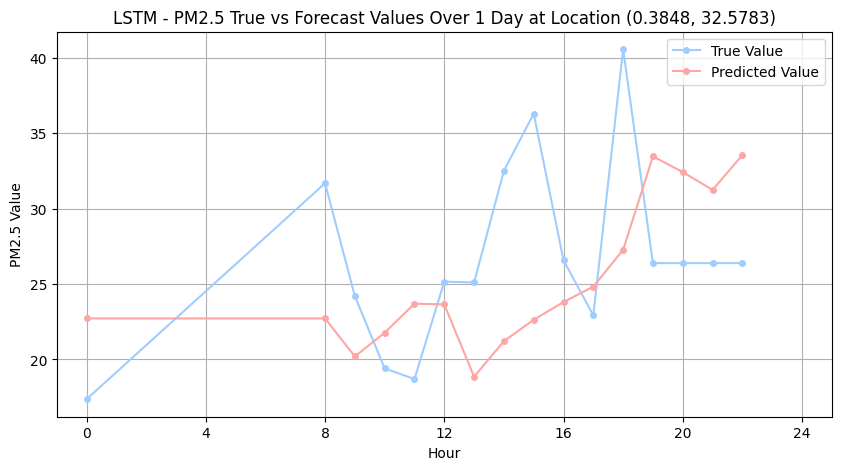

In [112]:
import pandas as pd
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day==1)]
# 假设 data_test_day 已经包含了所有站点的数据，并且数据已经按时间排序
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])

data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    # 拿到每个站点的第一个数据点（作为DataFrame的一行）
    initial_data = group.iloc[0:1]

    # 创建填充数据，需要使用 `initial_data` 的复制，保持DataFrame结构
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    
    # 重新设置填充数据的时间戳
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    
    # 合并填充数据和原始数据
    padded_group = pd.concat([padding, group])
    
    # 如果你需要保留分组信息，可以在这里添加
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])

# 确保整体DataFrame按时间排序（如果时间戳重要的话）
data_test_day_padded.sort_index(inplace=True)


# 创建序列
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day_padded, sequence_length)
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

offset = 0  # 初始化偏移量
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        outputs = outputs.squeeze()

        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        # 确保索引逻辑正确
        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))






import matplotlib.pyplot as plt
import pandas as pd

# 接下来是数据预处理和模型评估代码，假设已经正确设置

# 创建 DataFrame
results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})

# 根据地点分组并绘制
grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over 1 Day at Location ({lat:.4f}, {lon:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks([0, 4, 8, 12, 16, 20, 24])
    plt.xlim(-1, 25)
    plt.legend()
    plt.grid(True)
    plt.show()




Test RMSE: 17.068388992953675
Test MAE: 12.21346
Test MAPE: 57.53510341696117


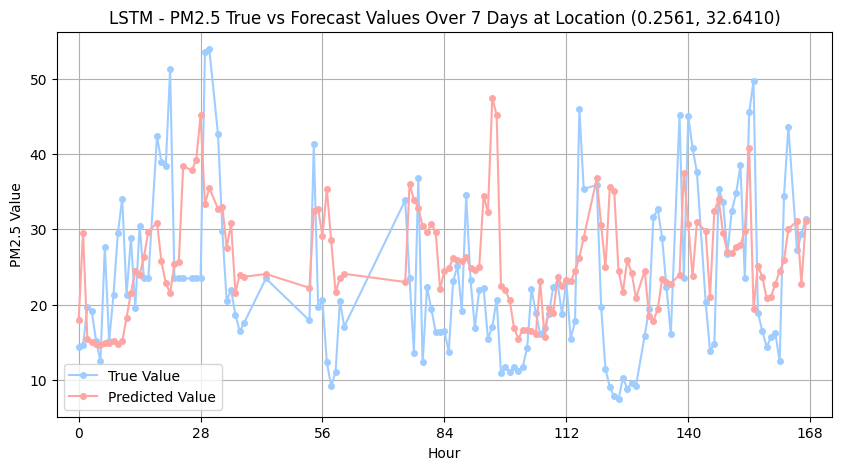

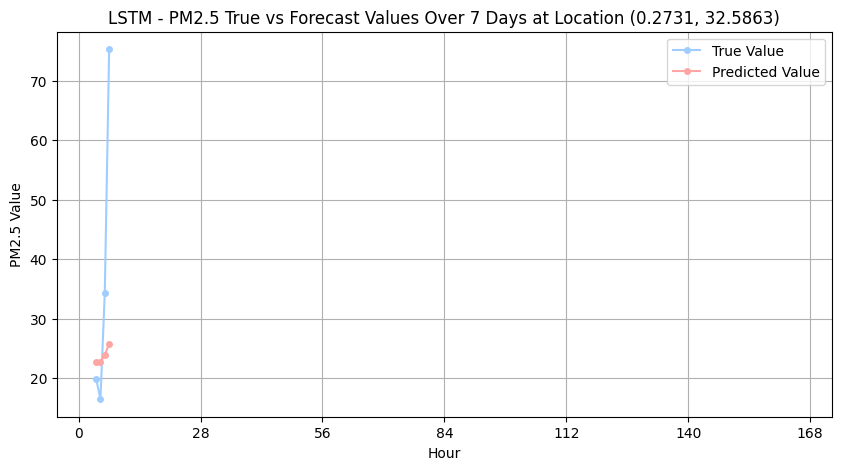

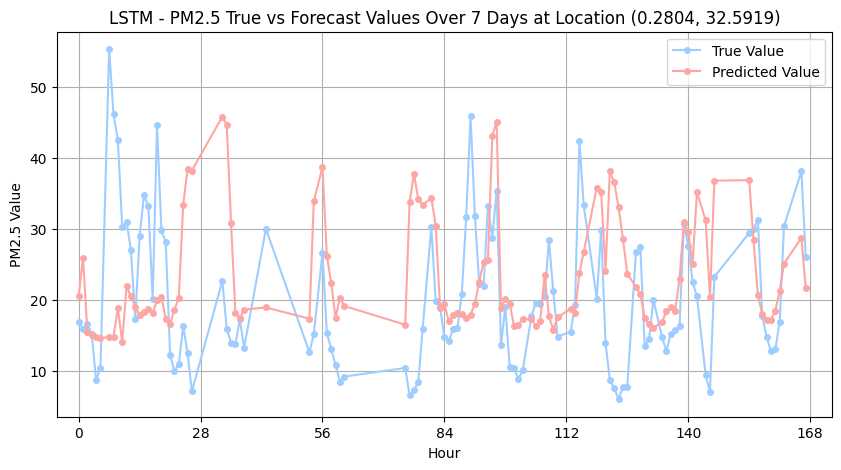

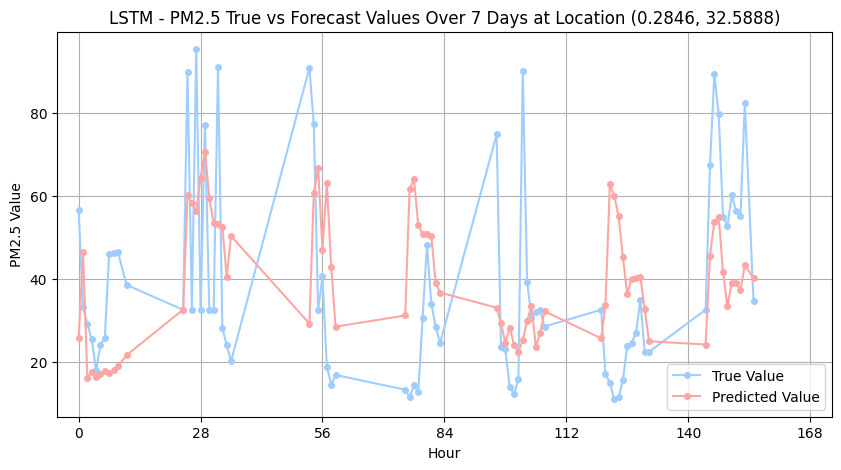

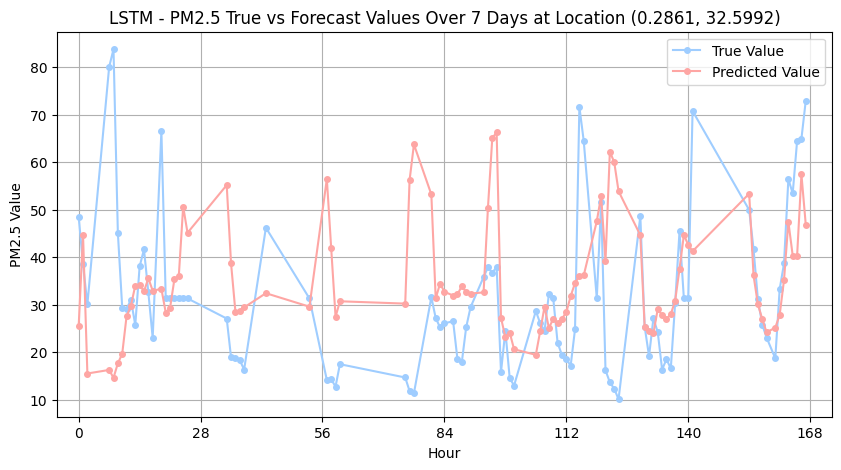

...

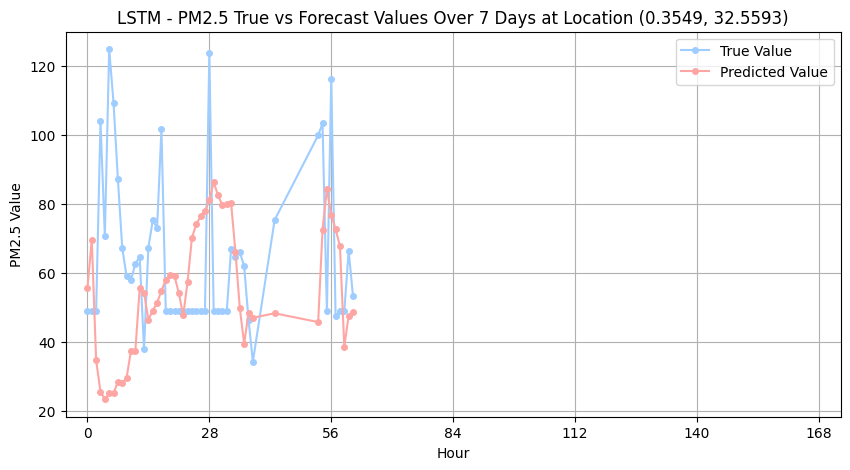

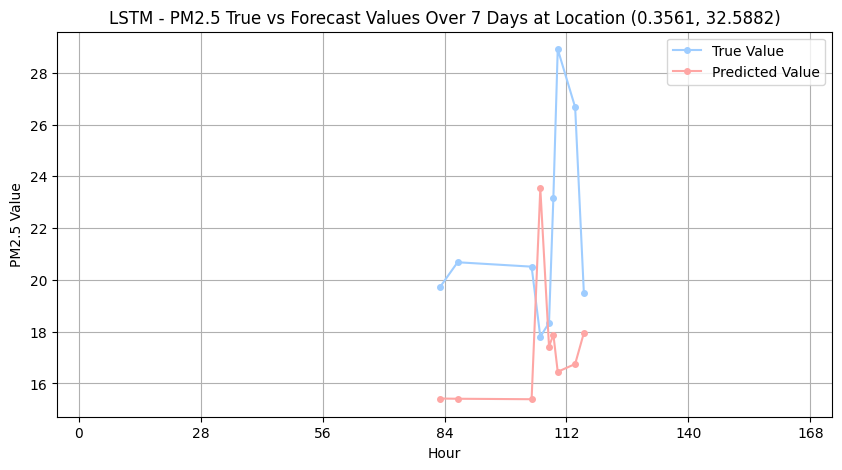

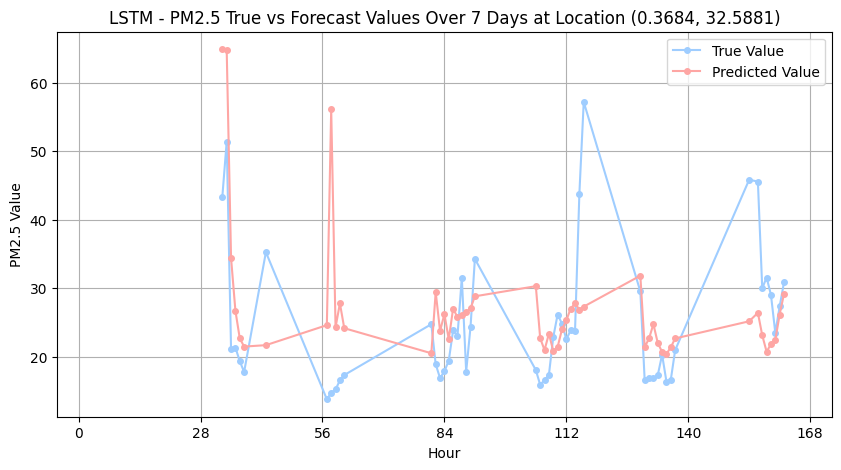

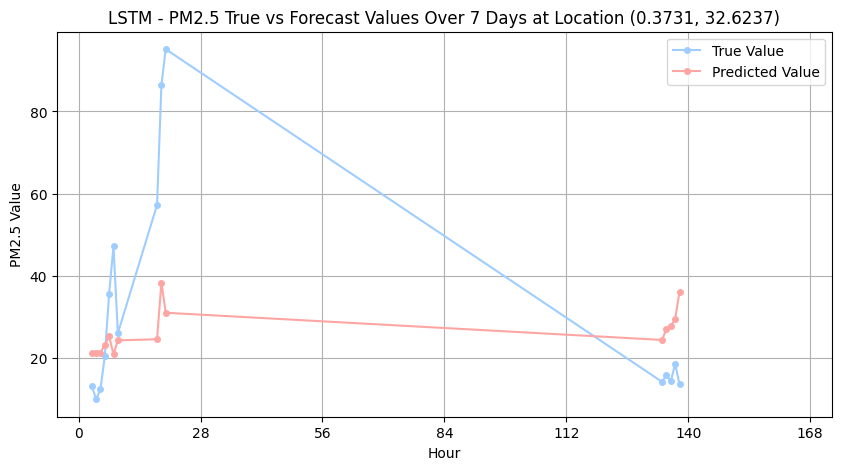

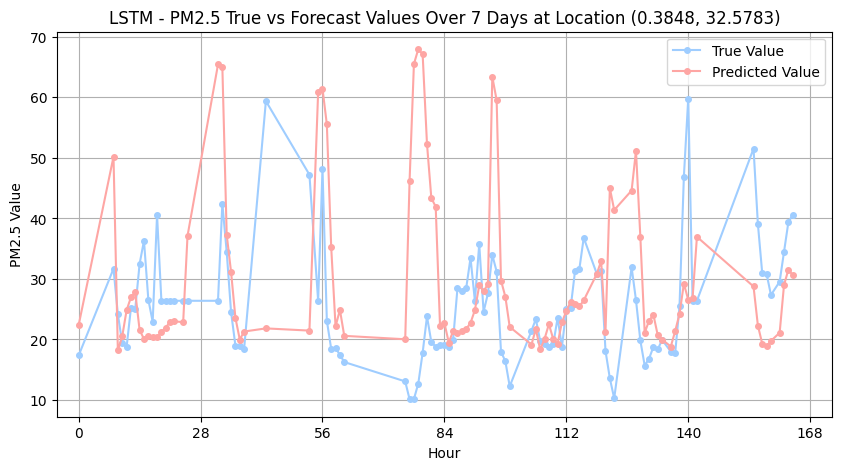

In [110]:
import pandas as pd
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=7)]
# 假设 data_test_day 已经包含了所有站点的数据，并且数据已经按时间排序
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])



data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    # 拿到每个站点的第一个数据点（作为DataFrame的一行）
    initial_data = group.iloc[0:1]

    # 创建填充数据，需要使用 `initial_data` 的复制，保持DataFrame结构
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    
    # 重新设置填充数据的时间戳
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    
    # 合并填充数据和原始数据
    padded_group = pd.concat([padding, group])
    
    # 如果你需要保留分组信息，可以在这里添加
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])

# 确保整体DataFrame按时间排序（如果时间戳重要的话）
data_test_day_padded.sort_index(inplace=True)

# 确保 data_test_day 是你的 DataFrame 名称，并且它有一个 datetime 类型的 index
data_test_day_padded['day'] = data_test_day_padded.index.day  # 提取天
min_day = data_test_day_padded['day'].min()  # 找到最小的天，即数据集的开始日期
data_test_day_padded['hour'] = (data_test_day_padded['day'] - min_day) * 24 + data_test_day_padded.index.hour  # 计算总小时数


# 创建序列
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day_padded, sequence_length)
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状


# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

offset = 0  # 初始化偏移量
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        outputs = outputs.squeeze()

        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        # 确保索引逻辑正确
        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))






import matplotlib.pyplot as plt
import pandas as pd

# 接下来是数据预处理和模型评估代码，假设已经正确设置

# 创建 DataFrame
results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})
# 根据地点分组并绘制
grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over 7 Days at Location ({lat:.4f}, {lon:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 169, 28))
    plt.xlim(-5, 173)
    plt.legend()
    plt.grid(True)
    plt.show()




Test RMSE: 17.38402589352944
Test MAE: 12.8896475
Test MAPE: 48.61867941997863


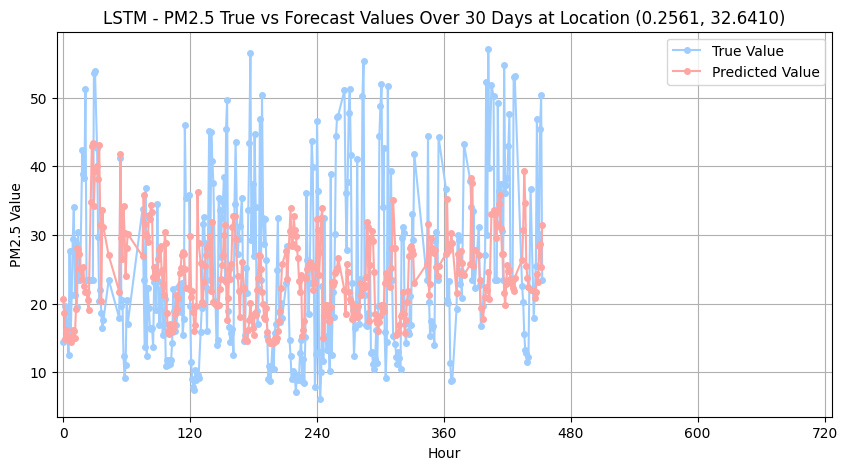

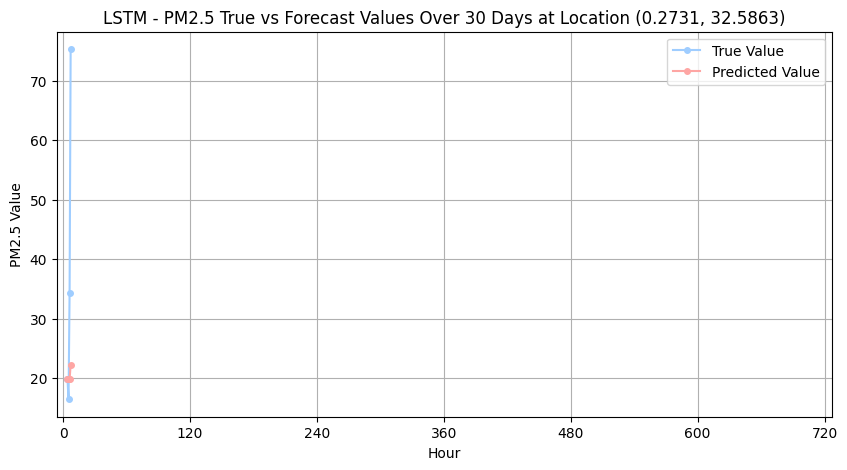

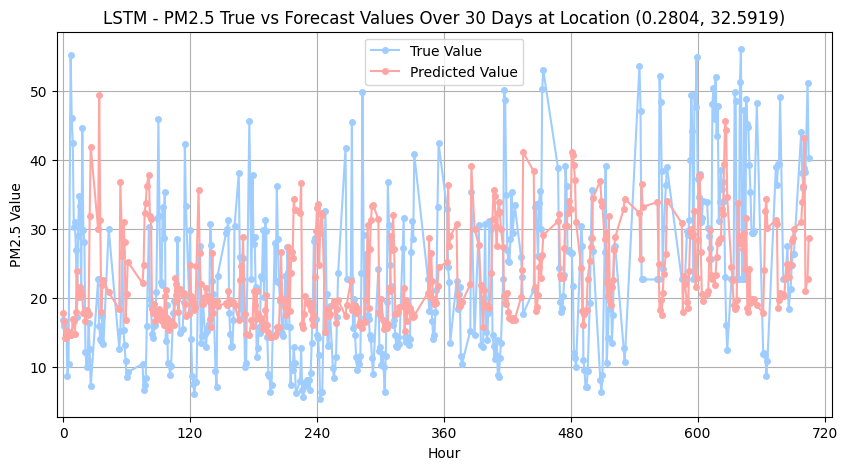

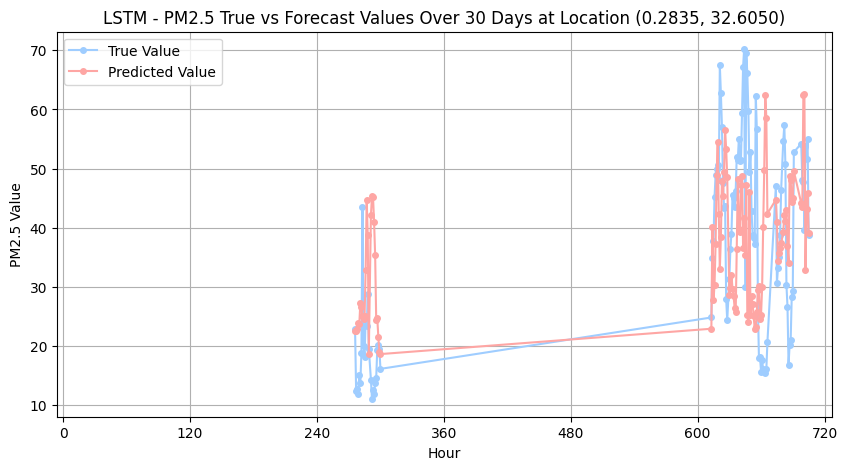

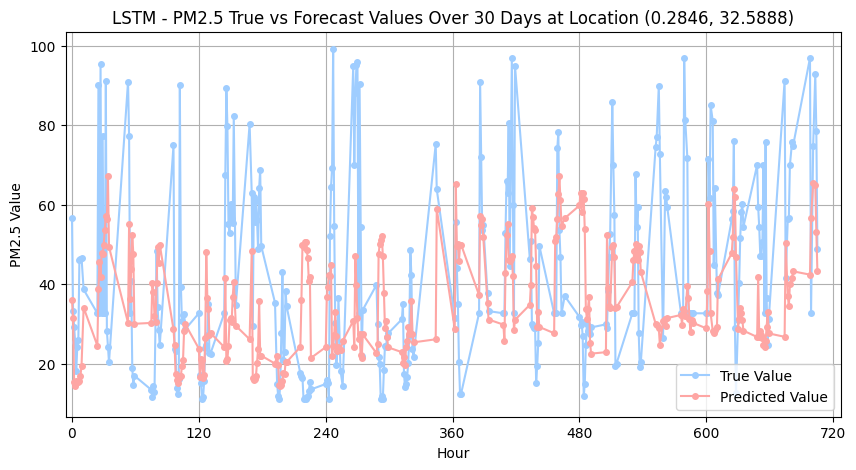

...

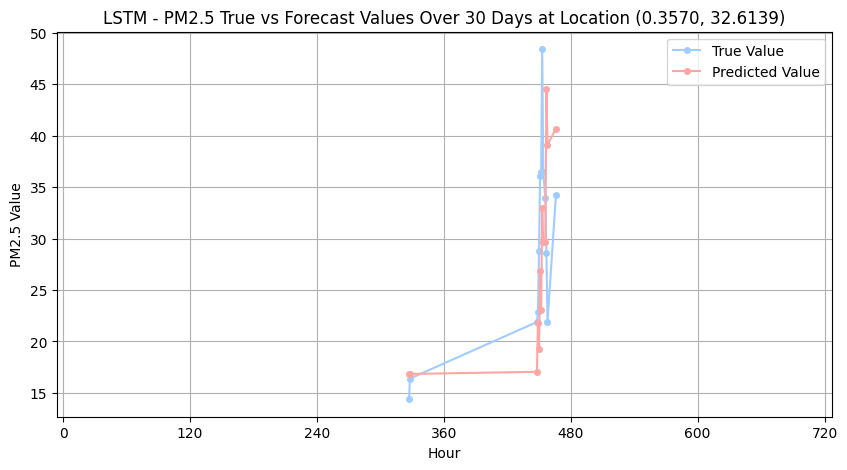

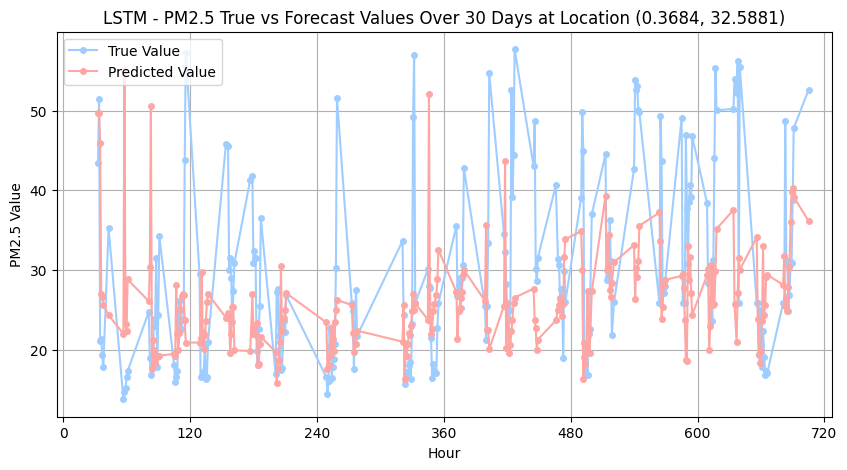

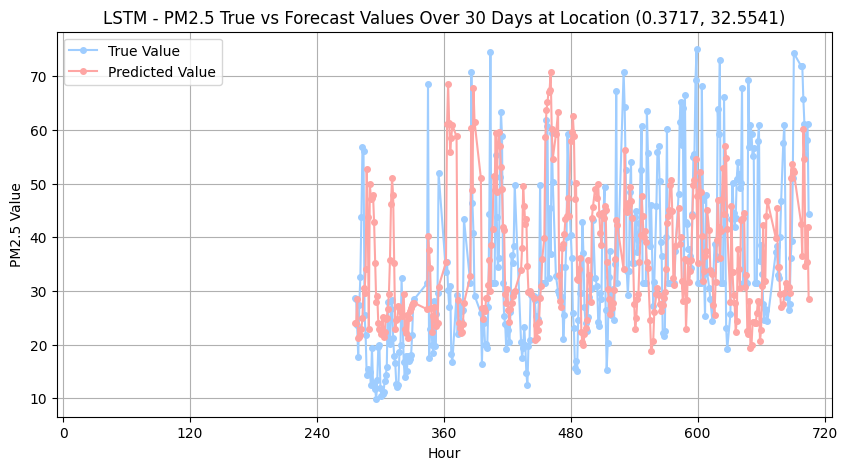

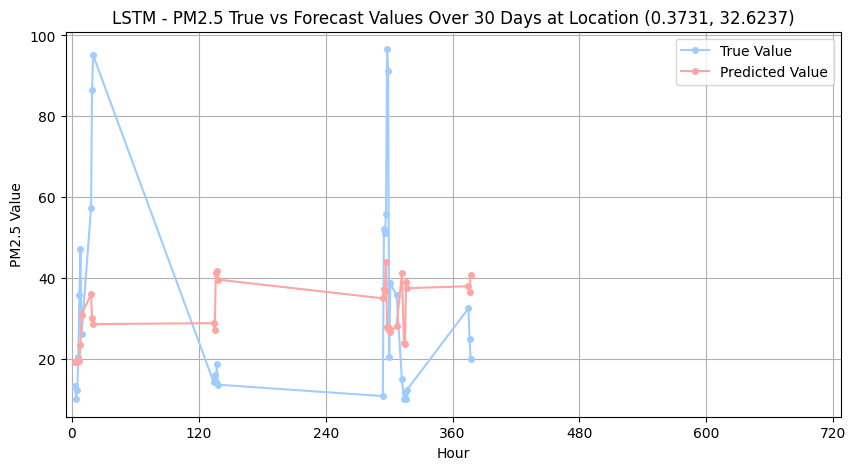

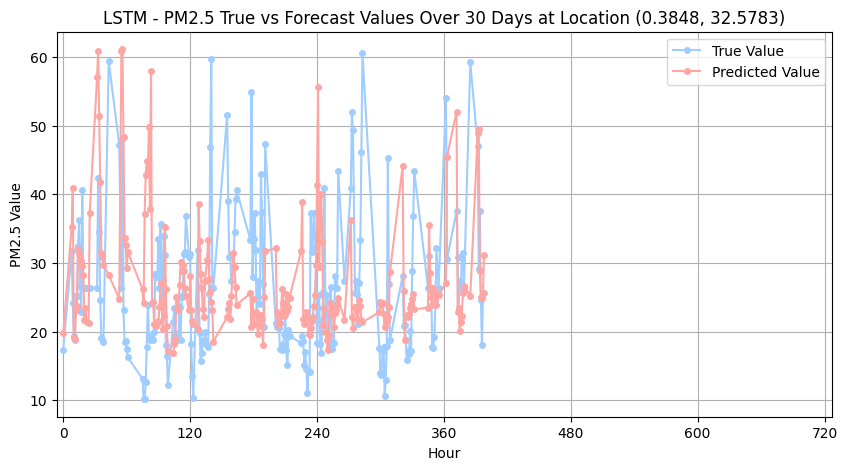

In [114]:
import pandas as pd
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=30)]
# 假设 data_test_day 已经包含了所有站点的数据，并且数据已经按时间排序
grouped = data_test_day.groupby(['site_latitude', 'site_longitude'])



data_test_day_padded = pd.DataFrame()

for (lat, lon), group in grouped:
    # 拿到每个站点的第一个数据点（作为DataFrame的一行）
    initial_data = group.iloc[0:1]

    # 创建填充数据，需要使用 `initial_data` 的复制，保持DataFrame结构
    padding = pd.concat([initial_data]*sequence_length, ignore_index=True)
    
    # 重新设置填充数据的时间戳
    padding.index = pd.date_range(end=initial_data.index[0] - pd.Timedelta(hours=1), periods=sequence_length, freq='h')
    
    # 合并填充数据和原始数据
    padded_group = pd.concat([padding, group])
    
    # 如果你需要保留分组信息，可以在这里添加
    padded_group['site_latitude'] = lat
    padded_group['site_longitude'] = lon
    
    data_test_day_padded = pd.concat([data_test_day_padded, padded_group])

# 确保整体DataFrame按时间排序（如果时间戳重要的话）
data_test_day_padded.sort_index(inplace=True)

# 确保 data_test_day 是你的 DataFrame 名称，并且它有一个 datetime 类型的 index
data_test_day_padded['day'] = data_test_day_padded.index.day  # 提取天
min_day = data_test_day_padded['day'].min()  # 找到最小的天，即数据集的开始日期
data_test_day_padded['hour'] = (data_test_day_padded['day'] - min_day) * 24 + data_test_day_padded.index.hour  # 计算总小时数


# 创建序列
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day_padded, sequence_length)
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状


# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False, drop_last=True)

offset = 0  # 初始化偏移量
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)

        outputs = outputs.squeeze()

        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        # 确保索引逻辑正确
        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))






import matplotlib.pyplot as plt
import pandas as pd

# 接下来是数据预处理和模型评估代码，假设已经正确设置

# 创建 DataFrame
results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})
# 根据地点分组并绘制
grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over 30 Days at Location ({lat:.4f}, {lon:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 721, 120))
    plt.xlim(-6, 727)
    plt.legend()
    plt.grid(True)
    plt.show()




In [ ]:

data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=7)]

# 创建序列
sequence_length = 3
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day, sequence_length)



In [ ]:
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

# 在模型上运行这个新的测试数据
model.eval()
test_day_losses, test_day_mae, test_day_mape = [], [], []
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = outputs.squeeze()  # 确保输出的维度和目标维度一致
        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))



Test RMSE: 15.26923875708891
Test MAE: 10.936184
Test MAPE: 45.92321179807186


In [ ]:

# 确保 data_test_day 是你的 DataFrame 名称，并且它有一个 datetime 类型的 index
data_test_day['day'] = data_test_day.index.day  # 提取天
min_day = data_test_day['day'].min()  # 找到最小的天，即数据集的开始日期
data_test_day['hour'] = (data_test_day['day'] - min_day) * 24 + data_test_day.index.hour  # 计算总小时数

# 创建序列
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day, sequence_length)
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

offset = 0  # 初始化偏移量
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        print("Current batch size:", inputs.size(0))  # 监测每个批次的大小
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        print("Outputs shape:", outputs.shape)  # 打印输出的形状

        outputs = outputs.squeeze()

        print("Outputs size:", outputs.size())  # 监测输出大小
        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        if len(outputs.cpu().numpy()) != inputs.size(0):
            print("Mismatch in outputs and inputs size")  # 监测尺寸不匹配的情况

        # 确保索引逻辑正确
        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))




In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
# 假设 data_test_day 已经按时间顺序排序且有时间戳索引
data_test_day['day'] = data_test_day.index.day
data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour

# 接下来是数据预处理和模型评估代码，假设已经正确设置

# 创建 DataFrame
results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})
# 根据地点分组并绘制
grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over Time at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 169, 28))
    plt.legend()
    plt.grid(True)
    plt.show()


In [ ]:

data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=30)]

# 创建序列
sequence_length = 3
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day, sequence_length)

In [ ]:
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

# 在模型上运行这个新的测试数据
model.eval()
test_day_losses, test_day_mae, test_day_mape = [], [], []
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = outputs.squeeze()  # 确保输出的维度和目标维度一致
        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))



Test RMSE: 17.1737143112773
Test MAE: 12.55768
Test MAPE: 44.543409825029954


In [ ]:
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)
offset = 0  # 初始化偏移量
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

# 在模型上运行这个新的测试数据
model.eval()
test_day_losses, test_day_mae, test_day_mape = [], [], []
with torch.no_grad():
    for inputs, targets in test_day_loader:
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        outputs = outputs.squeeze()  # 确保输出的维度和目标维度一致
        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)
        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())
         # 确保索引逻辑正确
        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size

# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))



Test RMSE: 17.1737143112773
Test MAE: 12.55768
Test MAPE: 44.543409825029954


In [ ]:

# 确保 data_test_day 是你的 DataFrame 名称，并且它有一个 datetime 类型的 index
data_test_day['day'] = data_test_day.index.day  # 提取天
min_day = data_test_day['day'].min()  # 找到最小的天，即数据集的开始日期
data_test_day['hour'] = (data_test_day['day'] - min_day) * 24 + data_test_day.index.hour  # 计算总小时数

# 创建序列
X_test_day, y_test_day, locations, hours = create_sequences_by_site(data_test_day, sequence_length)
# 假设`scaler`已经在之前的代码中使用X_train数据进行了拟合
# 正确地调整X_test_day的形状以适应scaler，并使用已训练的scaler进行转换
X_test_day_reshaped = X_test_day.reshape(-1, X_test_day.shape[-1])
X_test_day_scaled = scaler.fit_transform(X_test_day_reshaped)  # 使用transform而不是fit_transform
X_test_day_scaled = X_test_day_scaled.reshape(X_test_day.shape)  # 确保reshape到正确的原始形状

# 转换为张量
test_day_data = TensorDataset(torch.tensor(X_test_day_scaled, dtype=torch.float32), torch.tensor(y_test_day, dtype=torch.float32))

# 加载到 DataLoader
test_day_loader = DataLoader(test_day_data, batch_size=64, shuffle=False)

offset = 0  # 初始化偏移量
all_predictions = []
all_targets = []
all_locations = []
all_hours = []

test_day_losses, test_day_mae, test_day_mape = [], [], []

model.eval()        
with torch.no_grad():
    for inputs, targets in test_day_loader:
        print("Current batch size:", inputs.size(0))  # 监测每个批次的大小
        inputs, targets = inputs.to(device), targets.to(device)
        outputs = model(inputs)
        print("Outputs shape:", outputs.shape)  # 打印输出的形状

        outputs = outputs.squeeze()

        print("Outputs size:", outputs.size())  # 监测输出大小
        loss = criterion(outputs, targets)
        test_day_losses.append(loss.item())
        test_day_mae.append(mean_absolute_error(targets.cpu().numpy(), outputs.cpu().numpy()))
        test_day_mape.append(np.mean(np.abs((targets.cpu().numpy() - outputs.cpu().numpy()) / targets.cpu().numpy())) * 100)

        all_targets.extend(targets.cpu().numpy())
        all_predictions.extend(outputs.cpu().numpy())

        if len(outputs.cpu().numpy()) != inputs.size(0):
            print("Mismatch in outputs and inputs size")  # 监测尺寸不匹配的情况

        # 确保索引逻辑正确
        batch_size = inputs.size(0)
        batch_indices = range(offset, offset + batch_size)
        all_locations.extend([locations[i] for i in batch_indices])
        all_hours.extend([hours[i] for i in batch_indices])

        offset += batch_size


# 如果需要，可以打印或返回测试指标
print('Test RMSE:', np.sqrt(np.mean(test_day_losses)))
print('Test MAE:', np.mean(test_day_mae))
print('Test MAPE:', np.mean(test_day_mape))




C:\Users\DELL\AppData\Local\Temp\ipykernel_29260\3310718847.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['day'] = data_test_day.index.day  # 提取天
C:\Users\DELL\AppData\Local\Temp\ipykernel_29260\3310718847.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = (data_test_day['day'] - min_day) * 24 + data_test_day.index.hour  # 计算总小时数


Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 64
Outputs shape: torch.Size([64, 1])
Outputs size: torch.Size([64])
Current batch size: 6

C:\Users\DELL\AppData\Local\Temp\ipykernel_29260\3135777588.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['day'] = data_test_day.index.day
C:\Users\DELL\AppData\Local\Temp\ipykernel_29260\3135777588.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour


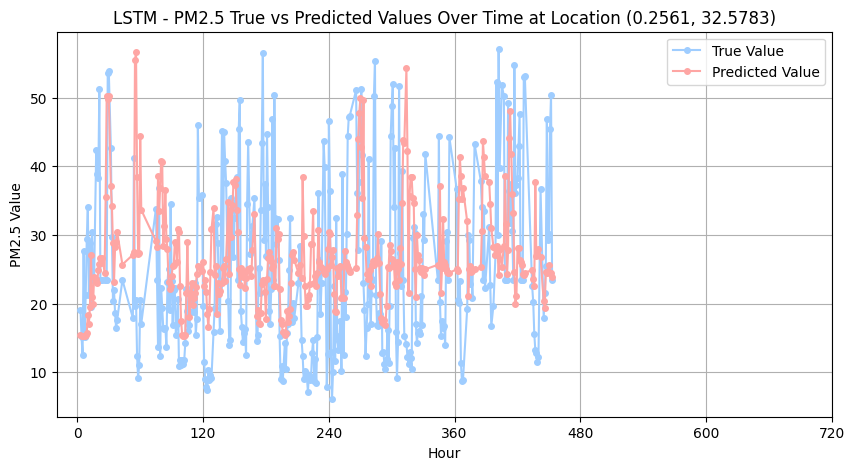

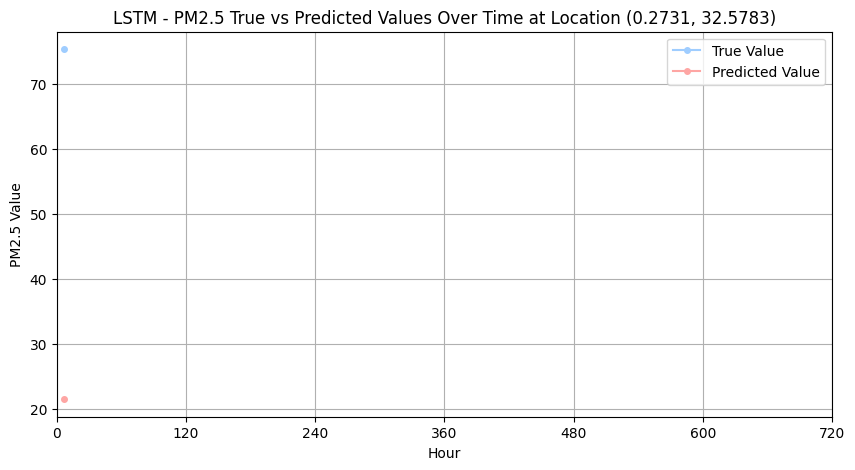

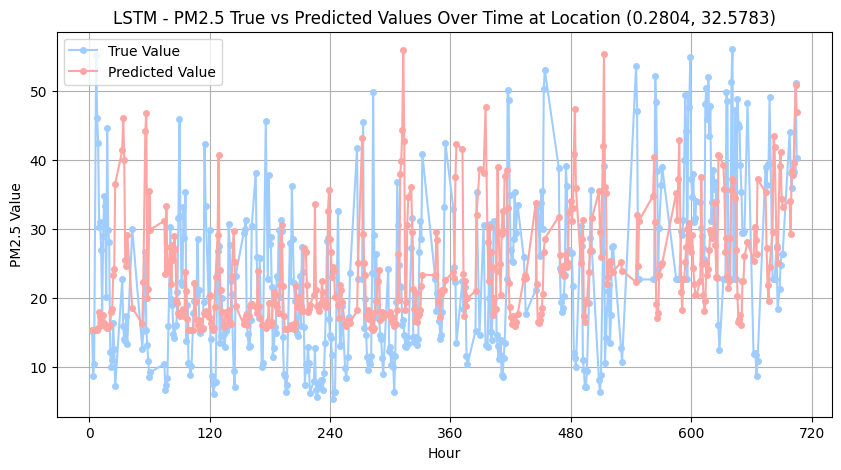

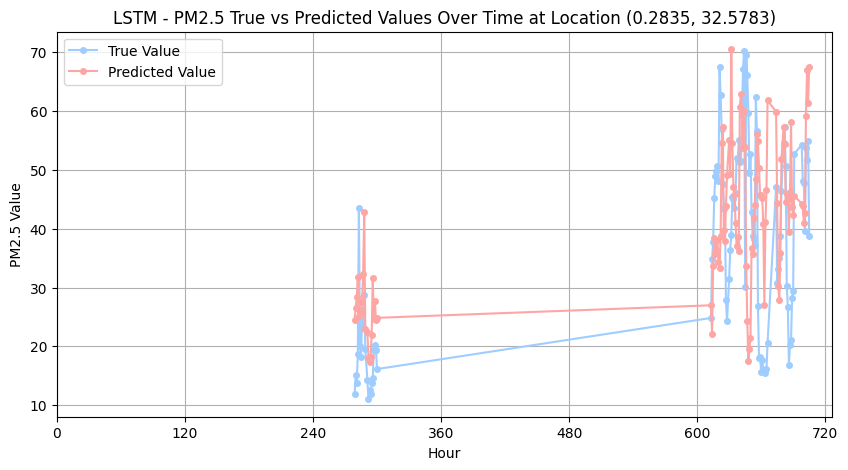

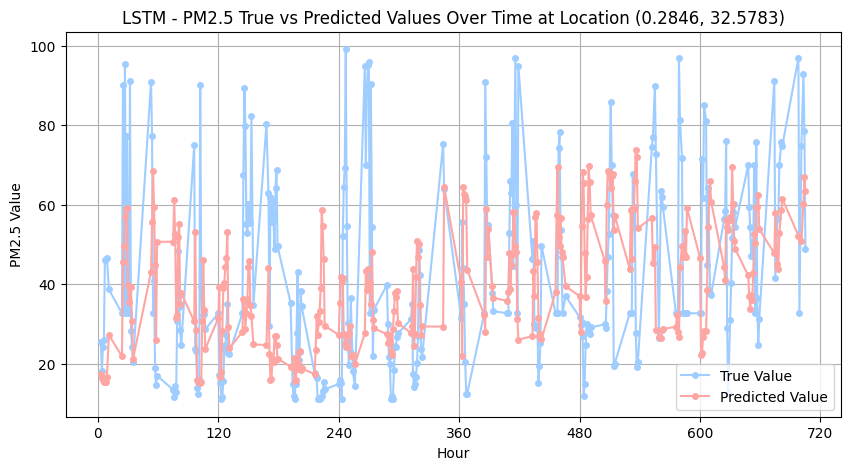

...

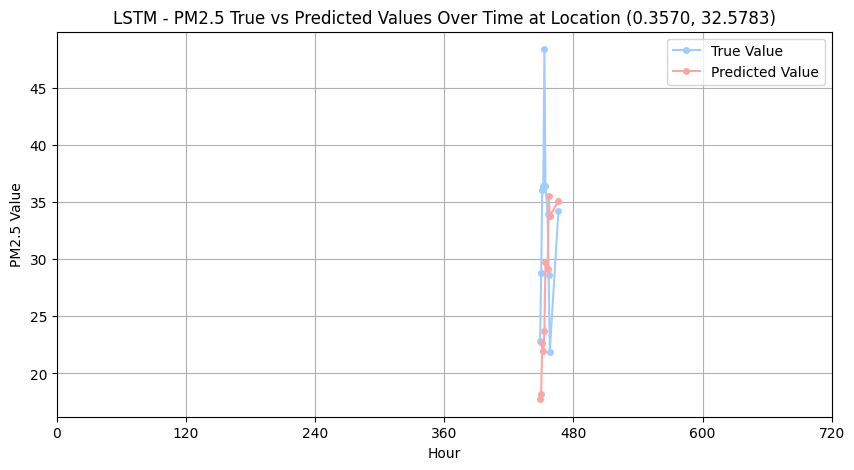

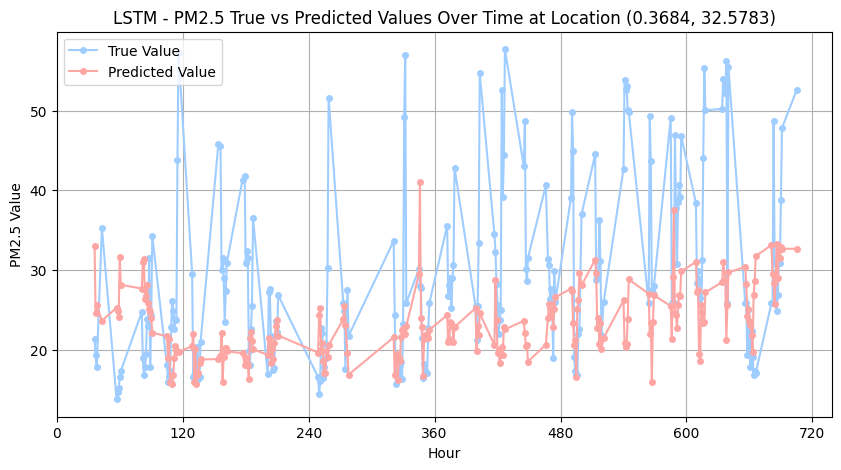

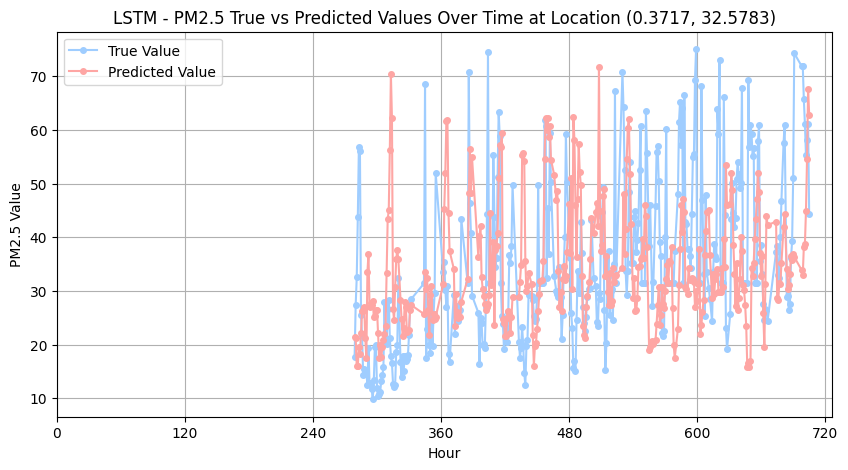

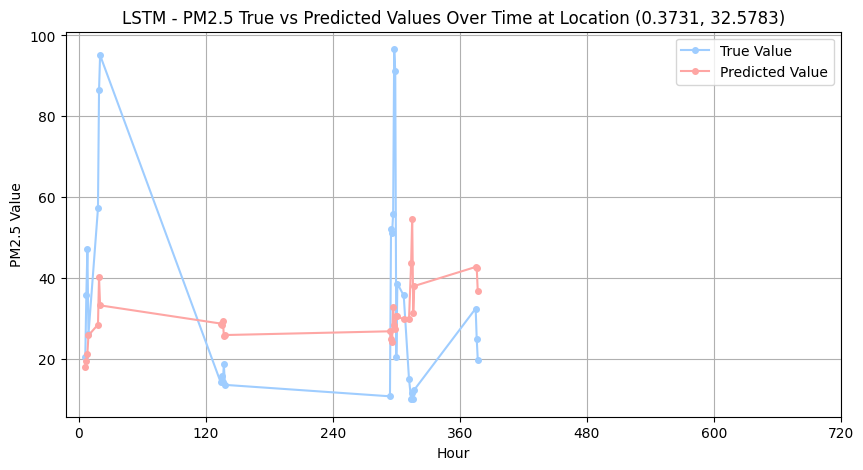

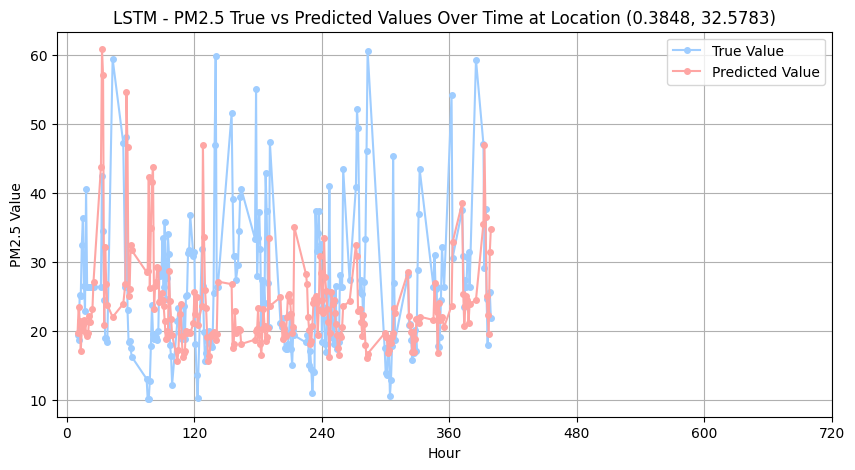

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
# 假设 data_test_day 已经按时间顺序排序且有时间戳索引
data_test_day['day'] = data_test_day.index.day
data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour

# 接下来是数据预处理和模型评估代码，假设已经正确设置

# 创建 DataFrame
results_df = pd.DataFrame({
    'Latitude': [loc[0] for loc in all_locations],
    'Longitude': [loc[1] for loc in all_locations],
    'True Values': all_targets,
    'Predicted Values': all_predictions,
    'Hour': all_hours
})
# 根据地点分组并绘制
grouped = results_df.groupby(['Latitude', 'Longitude'])
for (lat, lon), group in grouped:
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Values'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Values'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"LSTM - PM2.5 True vs Forecast Values Over Time at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 721, 120))
    plt.legend()
    plt.grid(True)
    plt.show()
